In [1]:
!pwd

/Users/renkohkato/ds/metisgh/scrapGit/nba


In [56]:
import requests
import pandas as pd
import numpy as np

In [57]:
from sklearn.linear_model import Lasso, Ridge, LinearRegression, LogisticRegression, ElasticNet
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.cross_validation import KFold
import scipy.stats as stats
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.externals.six import StringIO

#visualization
import seaborn as sns
from IPython.display import Image
import pydotplus
from sklearn.tree import export_graphviz

# visualization
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

### Load data

In [58]:
DF_Modeling = np.load('data/DF_Modeling.pkl')
data_advanced_15_17 = np.load('data/data_advanced_15_17.pkl')
data_per_min_15_17 = np.load('data/data_per_min_15_17.pkl')

#### Data Visualization

In [59]:
DF_Modeling.head()

,NAME,TEAM,SALARY,Contract_Yr,Year,Player_Match,bling1,bling2,name,weight,...,Bench_Player,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd
0,"Stephen Curry, PG",Golden State Warriors,34382550.0,2018,2017,STEPHEN CURRY,4x All Star,2015-16 NBA Scoring Champ,Stephen Curry,190.0,...,0,34.382550,34382550.0,34.382550,17.353060,17.353060,0,0,1,0
1,"LeBron James, SF",Cleveland Cavaliers,33285709.0,2018,2017,LEBRON JAMES,13x All Star,2007-08 NBA Scoring Champ,LeBron James,250.0,...,0,33.285709,33285709.0,33.285709,17.320639,17.320639,0,0,0,1
2,"Paul Millsap, PF",Denver Nuggets,31269231.0,2018,2017,PAUL MILLSAP,4x All Star,2015-16 All-Defensive,Paul Millsap,246.0,...,0,31.269231,31269231.0,31.269231,17.258145,17.258145,0,1,0,0
3,"Gordon Hayward, SF",Boston Celtics,29727900.0,2018,2017,GORDON HAYWARD,1x All Star,None,Gordon Hayward,226.0,...,0,29.727900,29727900.0,29.727900,17.207597,17.207597,0,0,0,1
4,"Blake Griffin, PF",LA Clippers,29512900.0,2018,2017,BLAKE GRIFFIN,5x All Star,4x All-NBA,Blake Griffin,251.0,...,0,29.512900,29512900.0,29.512900,17.200338,17.200338,0,1,0,0


In [60]:
DF_Modeling.columns

Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Year', 'Player_Match',
       'bling1', 'bling2', 'name', 'weight',
       ...
       'Bench_Player', 'SALARY_M', 'SAL_INFL', 'SAL_INFL_M', 'Log_SAL',
       'Log_SAL_INFL', 'Center', 'PowerFwd', 'PointG', 'SmallFwd'],
      dtype='object', length=114)

In [61]:
DF_Modeling.shape

(1048, 114)

In [62]:
# drop one year Stat values
drop_cols = list(data_advanced_15_17.columns[1:])
drop_cols2 = list(data_per_min_15_17.columns[3:-1])
#drop_cols3 = ['bling1', 'bling2']

DF_Modeling2 = DF_Modeling.drop(drop_cols, 1)
DF_Modeling2.drop(drop_cols2, 1, inplace=True)

# NEED TO DROP MORE COLUMNS
#data_per_min_15_17

In [63]:
DF_Modeling2.head()

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,...,Bench_Player,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd
0,"Stephen Curry, PG",Golden State Warriors,34382550.0,2018,STEPHEN CURRY,4x All Star,2015-16 NBA Scoring Champ,Stephen Curry,190.0,75.0,...,0,34.382550,34382550.0,34.382550,17.353060,17.353060,0,0,1,0
1,"LeBron James, SF",Cleveland Cavaliers,33285709.0,2018,LEBRON JAMES,13x All Star,2007-08 NBA Scoring Champ,LeBron James,250.0,80.0,...,0,33.285709,33285709.0,33.285709,17.320639,17.320639,0,0,0,1
2,"Paul Millsap, PF",Denver Nuggets,31269231.0,2018,PAUL MILLSAP,4x All Star,2015-16 All-Defensive,Paul Millsap,246.0,80.0,...,0,31.269231,31269231.0,31.269231,17.258145,17.258145,0,1,0,0
3,"Gordon Hayward, SF",Boston Celtics,29727900.0,2018,GORDON HAYWARD,1x All Star,None,Gordon Hayward,226.0,80.0,...,0,29.727900,29727900.0,29.727900,17.207597,17.207597,0,0,0,1
4,"Blake Griffin, PF",LA Clippers,29512900.0,2018,BLAKE GRIFFIN,5x All Star,4x All-NBA,Blake Griffin,251.0,82.0,...,0,29.512900,29512900.0,29.512900,17.200338,17.200338,0,1,0,0


In [64]:
auto_correlations = DF_Modeling2.corr()

In [65]:
auto_correlations['SAL_INFL_M'].sort_values(ascending=False)

SAL_INFL_M      1.000000
SAL_INFL        1.000000
SALARY_M        0.989538
SALARY          0.989538
Log_SAL_INFL    0.819703
Log_SAL         0.818834
WS_3AVG         0.738914
OWS_3AVG        0.694374
VORP_3AVG       0.687003
GS_3AVG         0.637694
DWS_3AVG        0.632923
MP_3AVG         0.630735
BPM_3AVG        0.599326
PER_3AVG        0.595890
OBPM_3AVG       0.571448
PTS_3AVG        0.540920
FG_3AVG         0.501752
WS/48_3AVG      0.496581
FT_3AVG         0.479797
USG%_3AVG       0.442389
FTA_3AVG        0.416958
2P_3AVG         0.404179
Award_Ind       0.399626
FGA_3AVG        0.394605
G_3AVG          0.380825
Exp_Yrs_Real    0.379031
2PA_3AVG        0.359592
TS%_3AVG        0.336651
AST%_3AVG       0.284741
FG%_3AVG        0.252706
                  ...   
2P%_3AVG        0.222916
FT%_3AVG        0.222797
DBPM_3AVG       0.211790
FTr_3AVG        0.193512
TOV_3AVG        0.182900
DRB_3AVG        0.151121
DRB%_3AVG       0.142937
3P%_3AVG        0.120923
weight          0.110733


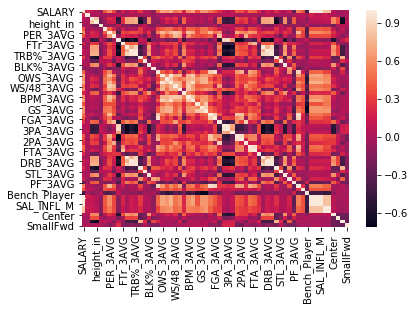

In [66]:
sns.heatmap(auto_correlations);

In [67]:
DF_Modeling2.corr()

,SALARY,Contract_Yr,weight,height_in,College_Ind,Award_Ind,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,...,Bench_Player,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd
SALARY,1.000000,0.192999,0.104962,0.050715,-0.089984,0.387819,0.585122,0.338061,-0.100728,0.189416,...,-0.415900,1.000000,0.989538,0.989538,0.816414,0.808548,0.055519,-0.022901,-0.007828,0.026559
Contract_Yr,0.192999,1.000000,-0.006331,0.020139,-0.020456,-0.023977,0.018267,0.050118,0.067795,-0.022694,...,-0.008746,0.192999,0.091536,0.091536,0.165310,0.084965,0.032584,-0.022127,-0.023829,0.017532
weight,0.104962,-0.006331,1.000000,0.826911,-0.160832,0.026287,0.226764,0.181769,-0.496947,0.280083,...,-0.103006,0.104962,0.110733,0.110733,0.120594,0.122055,0.569667,0.362590,-0.601822,-0.006347
height_in,0.050715,0.020139,0.826911,1.000000,-0.223929,-0.045037,0.147050,0.168402,-0.454014,0.260388,...,-0.058768,0.050715,0.051976,0.051976,0.078380,0.077302,0.576797,0.350389,-0.671741,0.067468
College_Ind,-0.089984,-0.020456,-0.160832,-0.223929,1.000000,-0.081049,-0.091110,-0.113521,0.100766,-0.127955,...,0.063505,-0.089984,-0.093090,-0.093090,-0.113644,-0.113208,-0.222034,0.026621,0.052552,0.034081
Award_Ind,0.387819,-0.023977,0.026287,-0.045037,-0.081049,1.000000,0.421456,0.217390,-0.110873,0.153035,...,-0.332728,0.387819,0.399626,0.399626,0.368516,0.374275,0.090588,-0.091560,0.096092,-0.063342
PER_3AVG,0.585122,0.018267,0.226764,0.147050,-0.091110,0.421456,1.000000,0.647803,-0.358470,0.351291,...,-0.361160,0.585122,0.595890,0.595890,0.511502,0.514830,0.252092,0.050982,0.028481,-0.132103
TS%_3AVG,0.338061,0.050118,0.181769,0.168402,-0.113521,0.217390,0.647803,1.000000,-0.062100,0.239774,...,-0.261647,0.338061,0.336651,0.336651,0.353373,0.352730,0.172451,0.041748,-0.137871,-0.011817
3PAr_3AVG,-0.100728,0.067795,-0.496947,-0.454014,0.100766,-0.110873,-0.358470,-0.062100,1.000000,-0.498156,...,0.105982,-0.100728,-0.111998,-0.111998,-0.110075,-0.115956,-0.557836,-0.174346,0.121945,0.260159
FTr_3AVG,0.189416,-0.022694,0.280083,0.260388,-0.127955,0.153035,0.351291,0.239774,-0.498156,1.000000,...,-0.123853,0.189416,0.193512,0.193512,0.123754,0.126812,0.368825,-0.006153,-0.080598,-0.106598


In [68]:
DF_Modeling2.columns.tolist()

['NAME',
 'TEAM',
 'SALARY',
 'Contract_Yr',
 'Player_Match',
 'bling1',
 'bling2',
 'name',
 'weight',
 'height_in',
 'College_Ind',
 'Award_Ind',
 'Pos',
 'PER_3AVG',
 'TS%_3AVG',
 '3PAr_3AVG',
 'FTr_3AVG',
 'ORB%_3AVG',
 'DRB%_3AVG',
 'TRB%_3AVG',
 'AST%_3AVG',
 'STL%_3AVG',
 'BLK%_3AVG',
 'TOV%_3AVG',
 'USG%_3AVG',
 'OWS_3AVG',
 'DWS_3AVG',
 'WS_3AVG',
 'WS/48_3AVG',
 'OBPM_3AVG',
 'DBPM_3AVG',
 'BPM_3AVG',
 'VORP_3AVG',
 'G_3AVG',
 'GS_3AVG',
 'MP_3AVG',
 'FG_3AVG',
 'FGA_3AVG',
 'FG%_3AVG',
 '3P_3AVG',
 '3PA_3AVG',
 '3P%_3AVG',
 '2P_3AVG',
 '2PA_3AVG',
 '2P%_3AVG',
 'FT_3AVG',
 'FTA_3AVG',
 'FT%_3AVG',
 'ORB_3AVG',
 'DRB_3AVG',
 'TRB_3AVG',
 'AST_3AVG',
 'STL_3AVG',
 'BLK_3AVG',
 'TOV_3AVG',
 'PF_3AVG',
 'PTS_3AVG',
 'Exp_Yrs_Real',
 'Bench_Player',
 'SALARY_M',
 'SAL_INFL',
 'SAL_INFL_M',
 'Log_SAL',
 'Log_SAL_INFL',
 'Center',
 'PowerFwd',
 'PointG',
 'SmallFwd']

In [69]:
X_all_cols = DF_Modeling2.columns.tolist()[8:12] + \
             DF_Modeling2.columns.tolist()[13:35]+\
             DF_Modeling2.columns.tolist()[-4:-1]
#              DF_Modeling2.columns.tolist()[14:-7] + \
        
X_mult_all = DF_Modeling2[X_all_cols]
X_mult_all.head()

,weight,height_in,College_Ind,Award_Ind,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,ORB%_3AVG,DRB%_3AVG,...,WS/48_3AVG,OBPM_3AVG,DBPM_3AVG,BPM_3AVG,VORP_3AVG,G_3AVG,GS_3AVG,Center,PowerFwd,PointG
0,190.0,75.0,1.0,1.0,28.033333,0.643667,0.527667,0.250667,2.666667,12.133333,...,0.278333,9.933333,0.000000,9.900000,7.966667,79.333333,79.333333,0,0,1
1,250.0,80.0,0.0,1.0,26.800000,0.594667,0.239333,0.385000,3.700000,18.700000,...,0.220667,6.633333,1.700000,8.300000,6.933333,73.000000,73.000000,0,0,0
2,246.0,80.0,1.0,1.0,19.700000,0.554333,0.232667,0.387333,6.866667,20.333333,...,0.160333,1.066667,2.966667,4.066667,3.766667,74.333333,73.666667,0,1,0
3,226.0,80.0,1.0,1.0,20.233333,0.573667,0.323000,0.397667,2.400000,14.300000,...,0.168333,3.366667,0.000000,3.366667,3.633333,76.333333,76.333333,0,0,0
4,251.0,82.0,1.0,1.0,22.500000,0.554667,0.056000,0.376333,5.700000,20.133333,...,0.172667,2.666667,1.300000,3.933333,2.866667,54.333333,54.333333,0,1,0


In [70]:
y = DF_Modeling2['SAL_INFL_M']

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X_mult_all, y, test_size=0.4, random_state=20)

In [72]:
decision_tree = DecisionTreeRegressor(max_depth=2)
decision_tree.fit(X_train, y_train)
print( "Decision Tree RMSE:", np.sqrt(mean_squared_error(y_test,decision_tree.predict(X_test))))

Decision Tree RMSE: 5.19606845319


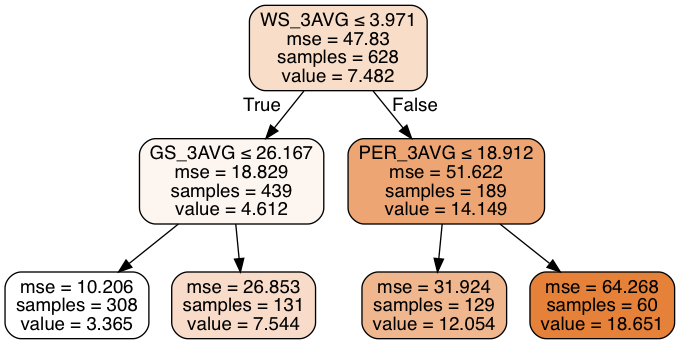

In [73]:
dot_data = StringIO()  
export_graphviz(decision_tree, out_file=dot_data,  
                    feature_names=X_train.columns.tolist(),  
                    filled=True, rounded=True,  
                    special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Decision Tree Train/Test RMSE: 5.35705531359   5.9043917888
Decision Tree Train/Test RMSE: 4.82751505018   5.19606845319
Decision Tree Train/Test RMSE: 4.36604923184   5.39466298886
Decision Tree Train/Test RMSE: 3.96663822869   5.33407942765
Decision Tree Train/Test RMSE: 3.61247783241   5.39276843687
Decision Tree Train/Test RMSE: 3.21504023365   5.44484528656
Decision Tree Train/Test RMSE: 2.55999344132   5.87488985554
Decision Tree Train/Test RMSE: 2.08986108778   6.03226287846
Decision Tree Train/Test RMSE: 1.54169546604   6.00807453035
Decision Tree Train/Test RMSE: 1.0227201133   6.1744316645


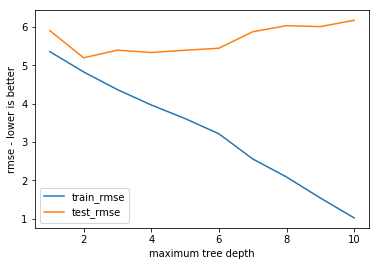

In [74]:
# Generating decision trees based on depths from 2 - 10
depths = range(1,11)

# Train error / Test Eror
train_rmse, test_rmse = [],[]
for depth in depths:
    decision_tree = DecisionTreeRegressor(max_depth=depth, random_state=10)
    decision_tree.fit(X_train, y_train)
    curr_train_rmse = np.sqrt(mean_squared_error(y_train, decision_tree.predict(X_train)))
    curr_test_rmse = np.sqrt(mean_squared_error(y_test, decision_tree.predict(X_test)))
    print( "Decision Tree Train/Test RMSE:", curr_train_rmse," ", curr_test_rmse)
    train_rmse.append(curr_train_rmse)
    test_rmse.append(curr_test_rmse)
    
plt.plot(depths,train_rmse,label='train_rmse')
plt.plot(depths,test_rmse,label='test_rmse')
plt.xlabel("maximum tree depth")
plt.ylabel("rmse - lower is better")
plt.legend();

In [75]:
DF_Modeling2["SAL_bins"] = pd.cut(DF_Modeling2['SALARY_M'], 6)
DF_Modeling2.SAL_bins.value_counts()

(-0.0286, 5.735]    607
(5.735, 11.465]     210
(11.465, 17.194]    137
(17.194, 22.924]     59
(22.924, 28.653]     28
(28.653, 34.383]      7
Name: SAL_bins, dtype: int64

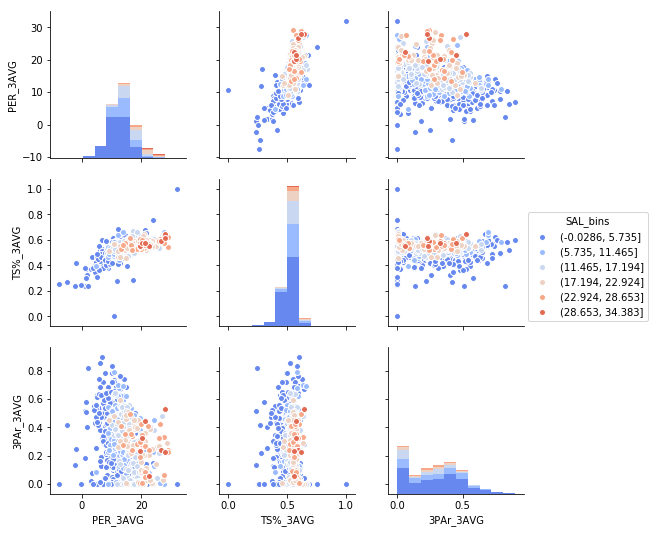

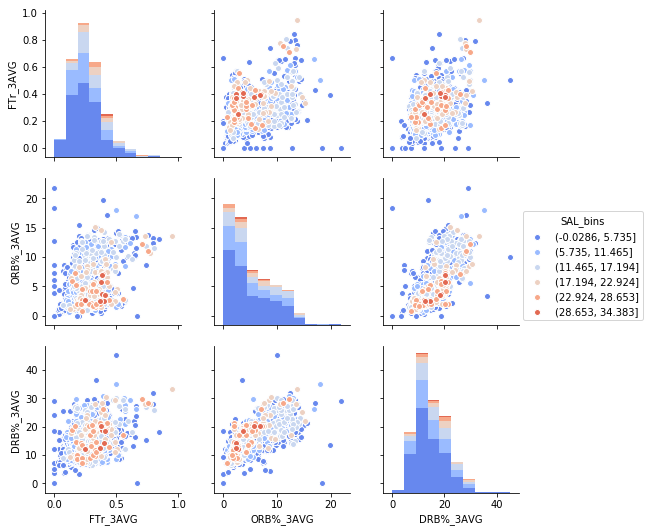

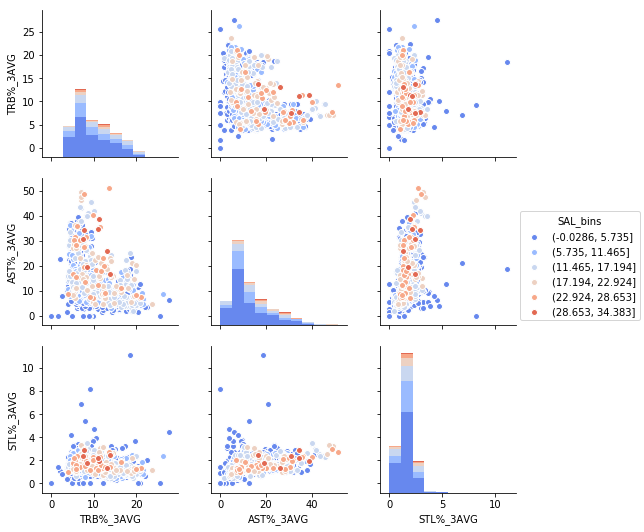

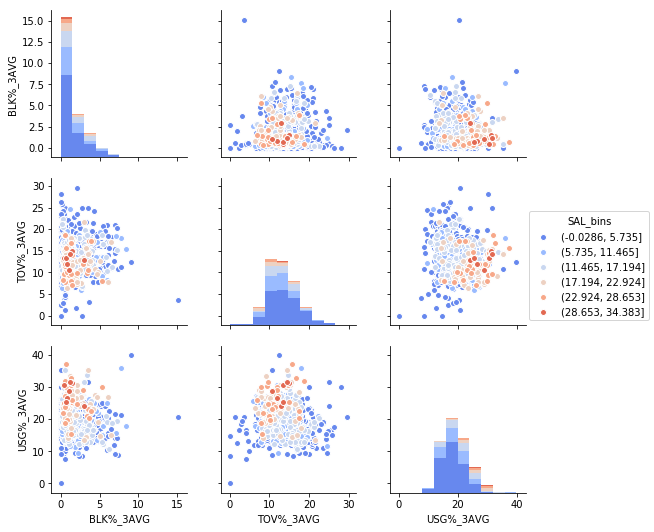

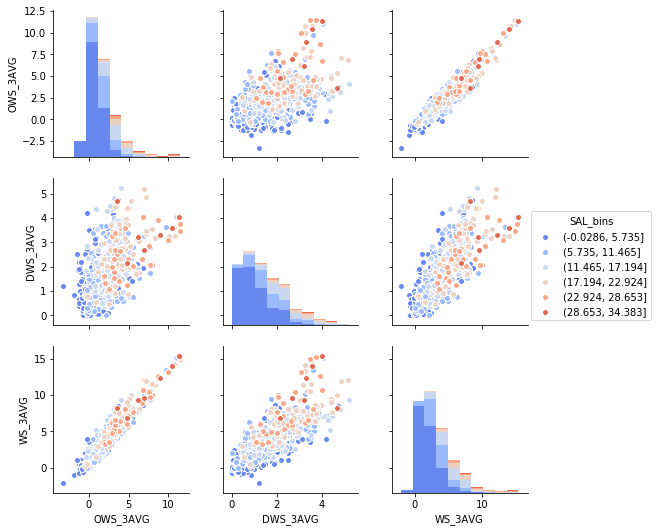

...

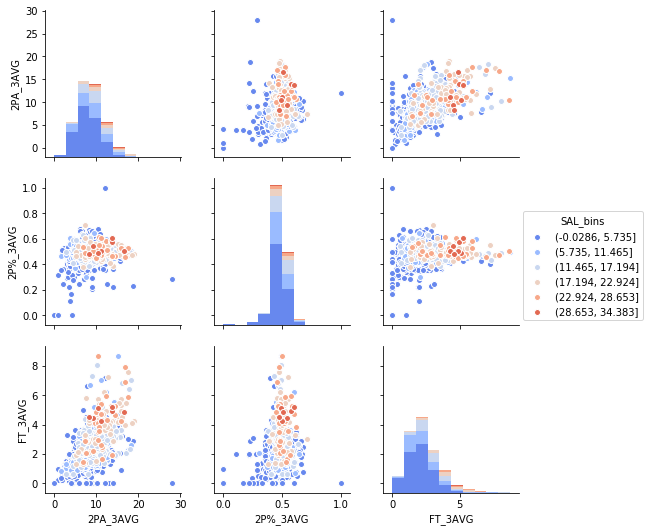

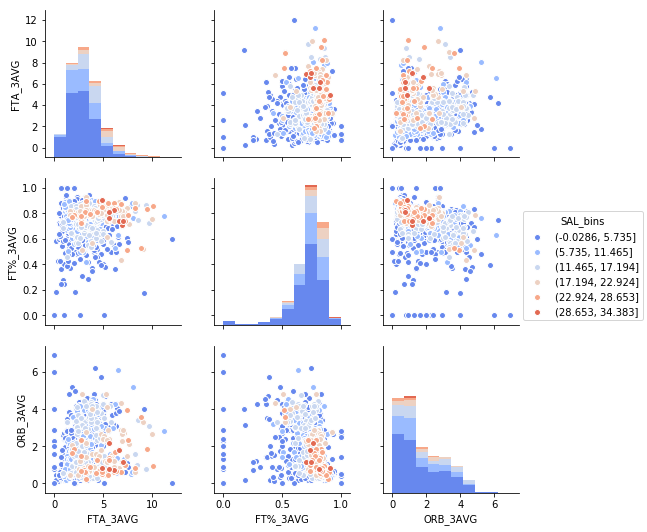

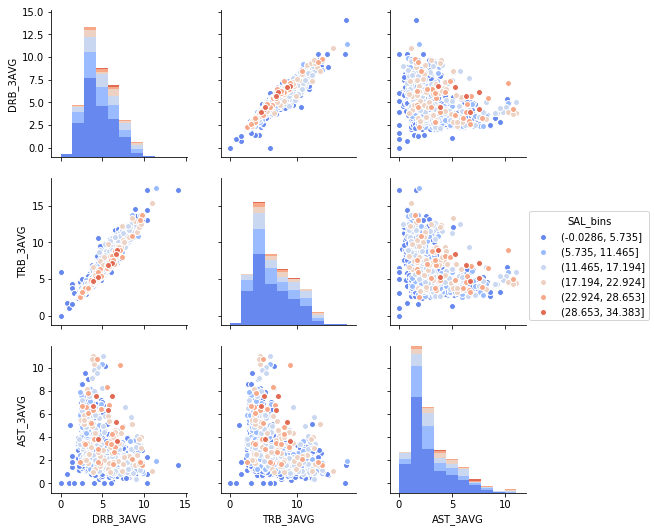

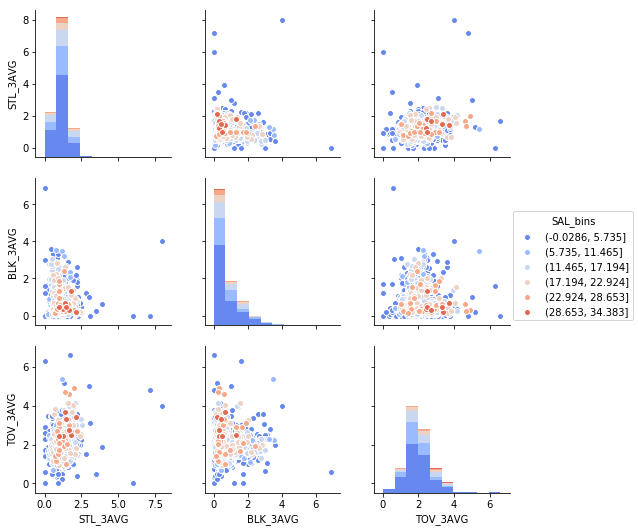

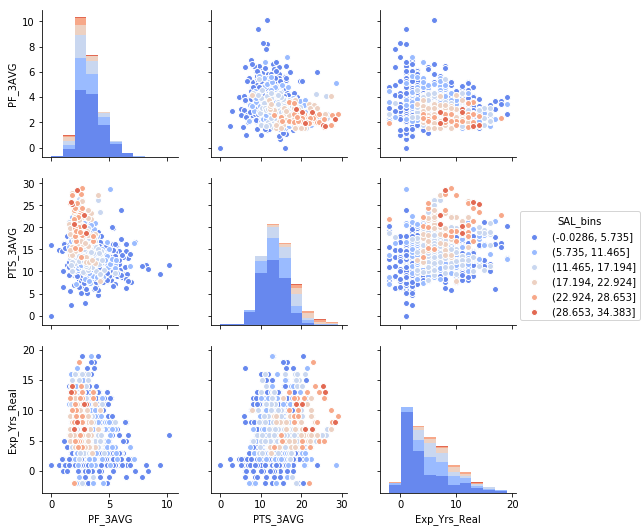

In [76]:
for i in range(13, 56, 3):
    sns.pairplot(DF_Modeling2[DF_Modeling2.columns.tolist()[i:i+3] + ['SAL_bins']], hue="SAL_bins", palette='coolwarm')

### Pair Plots

In [77]:
for i in range(13, 56, 3):
    print(DF_Modeling2.columns.tolist()[i:i+3])

['PER_3AVG', 'TS%_3AVG', '3PAr_3AVG']
['FTr_3AVG', 'ORB%_3AVG', 'DRB%_3AVG']
['TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG']
['BLK%_3AVG', 'TOV%_3AVG', 'USG%_3AVG']
['OWS_3AVG', 'DWS_3AVG', 'WS_3AVG']
['WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG']
['BPM_3AVG', 'VORP_3AVG', 'G_3AVG']
['GS_3AVG', 'MP_3AVG', 'FG_3AVG']
['FGA_3AVG', 'FG%_3AVG', '3P_3AVG']
['3PA_3AVG', '3P%_3AVG', '2P_3AVG']
['2PA_3AVG', '2P%_3AVG', 'FT_3AVG']
['FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG']
['DRB_3AVG', 'TRB_3AVG', 'AST_3AVG']
['STL_3AVG', 'BLK_3AVG', 'TOV_3AVG']
['PF_3AVG', 'PTS_3AVG', 'Exp_Yrs_Real']


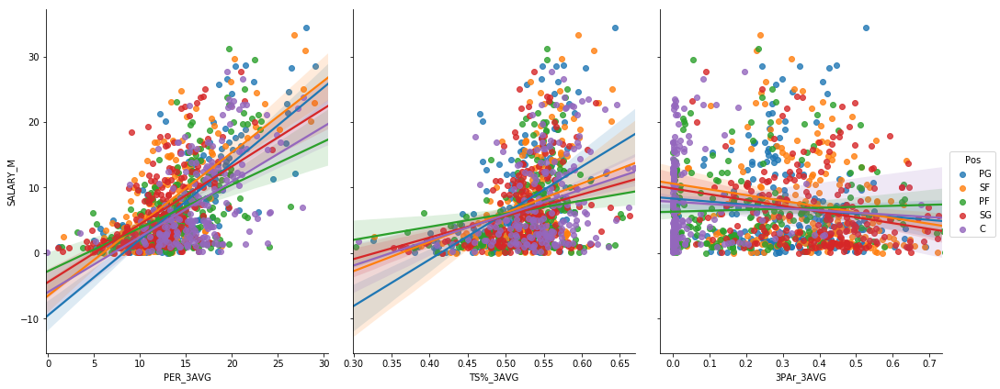

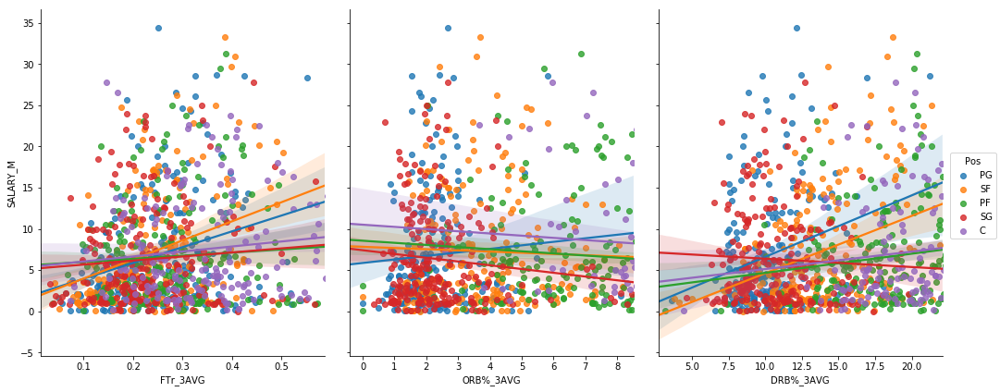

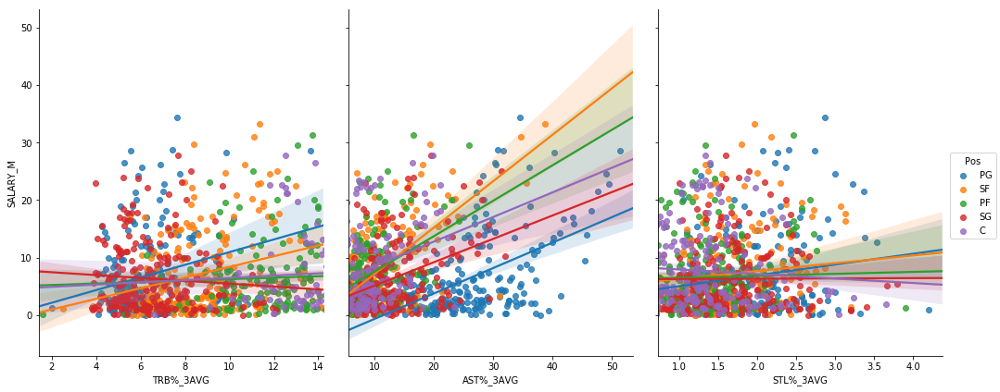

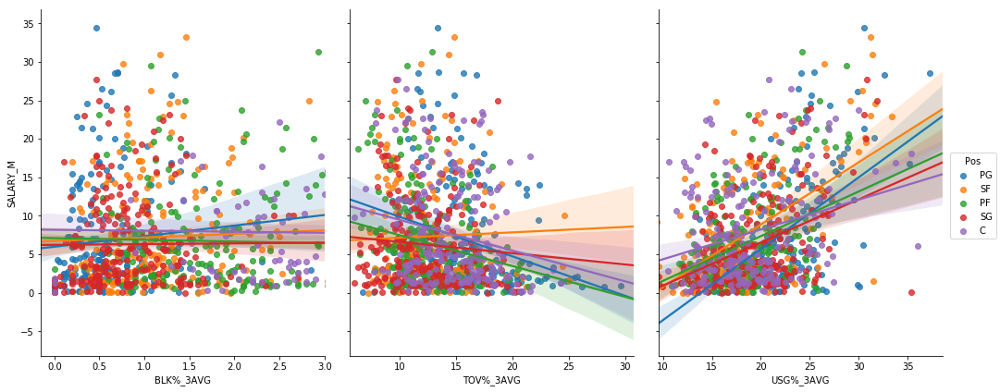

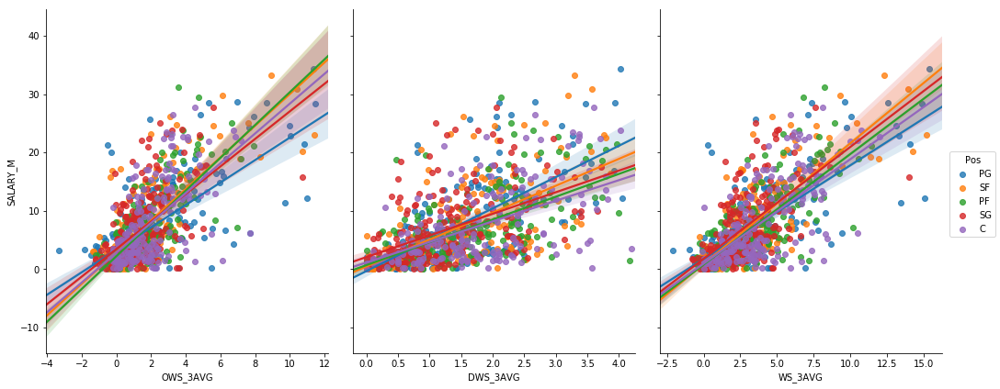

...

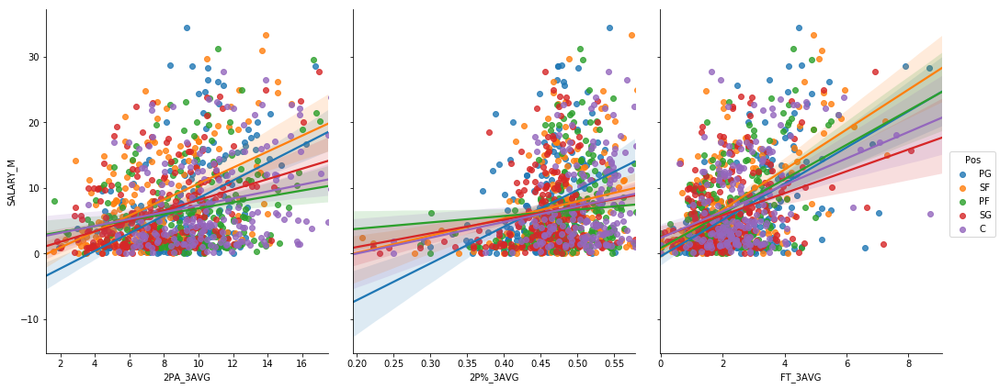

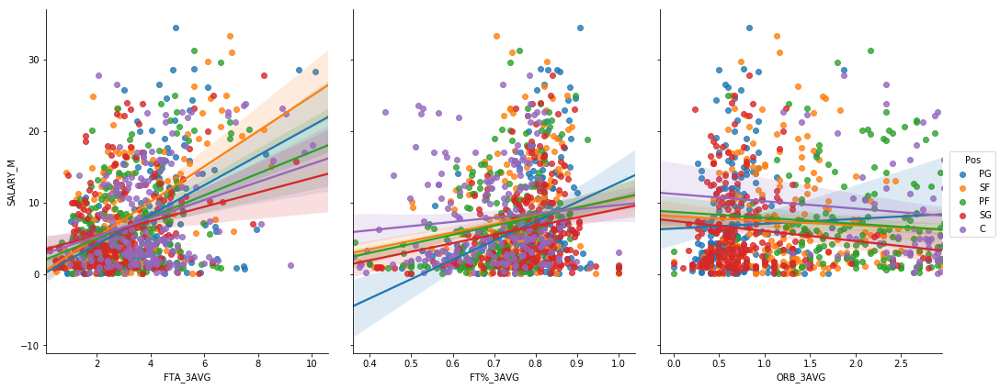

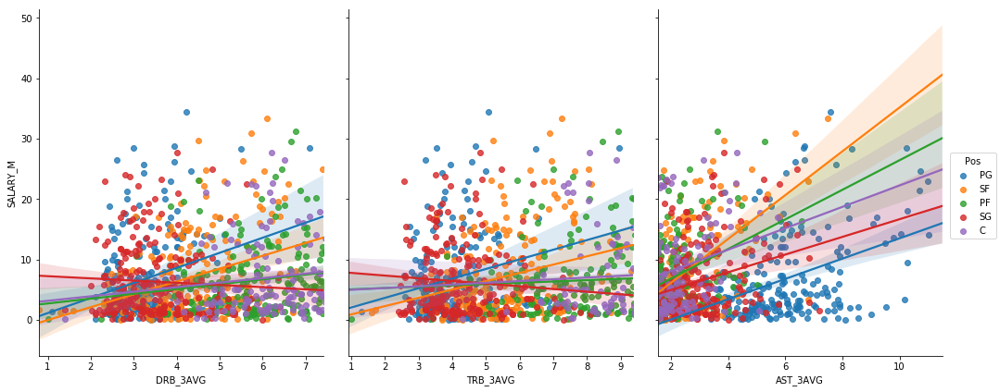

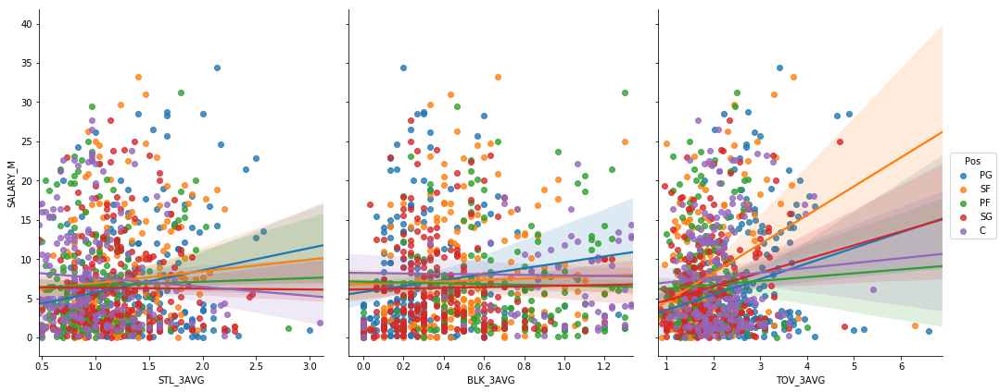

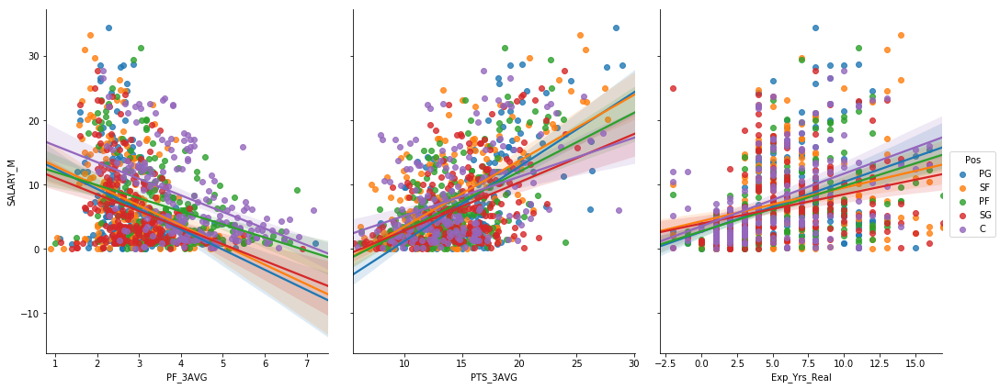

In [78]:
# Regress against SALARY
for i in range(13, 56, 3):
    sns.pairplot(DF_Modeling2, x_vars=DF_Modeling2.columns.tolist()[i:i+3], 
                     y_vars='SALARY_M',hue = 'Pos', size=6, aspect=0.8, kind='reg')

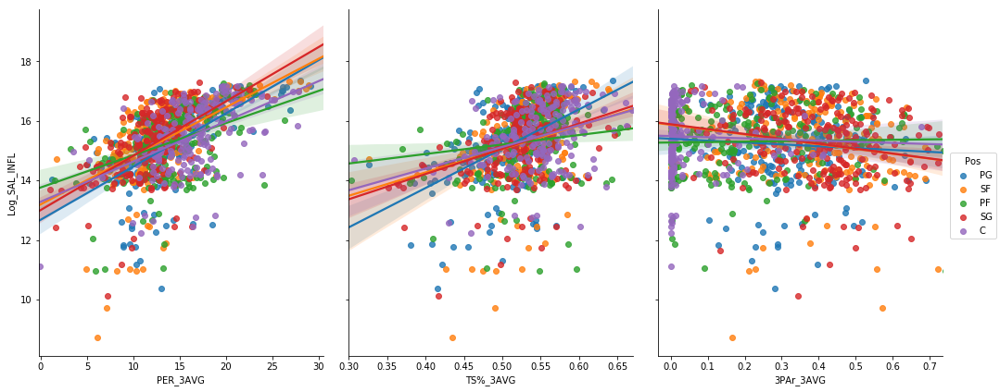

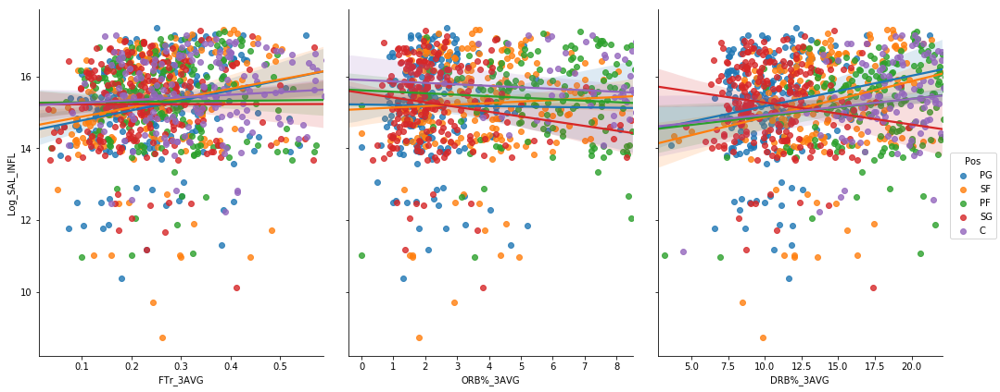

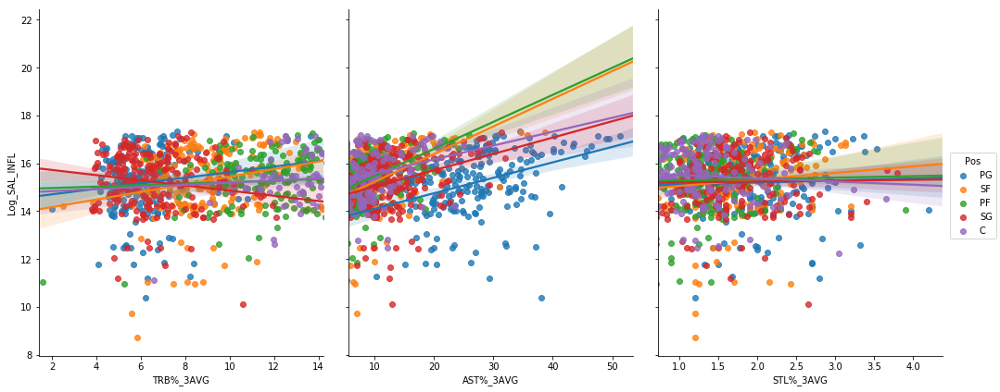

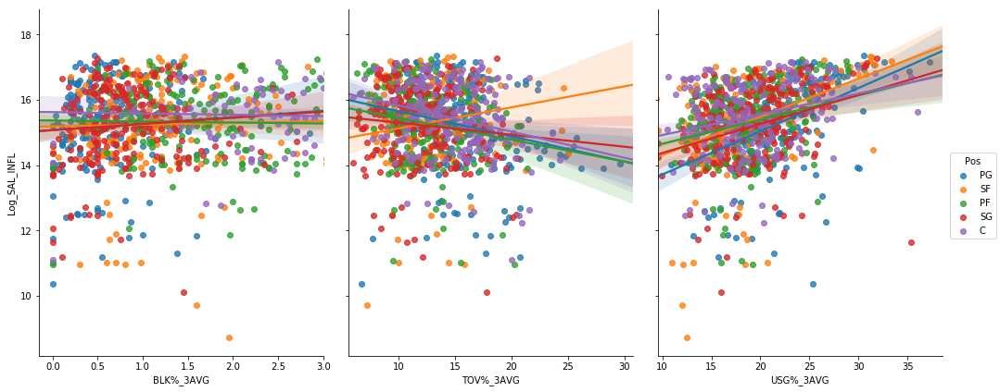

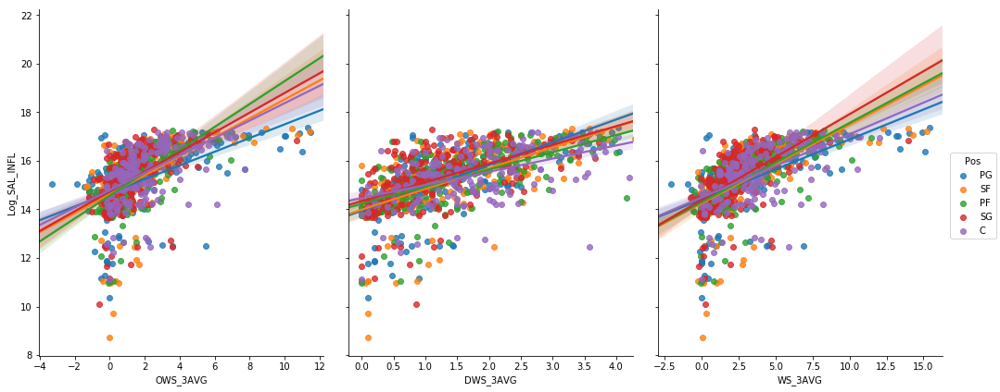

...

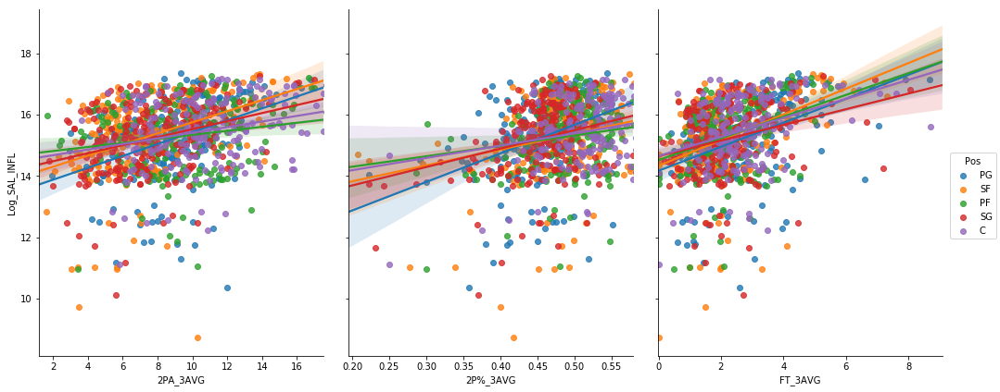

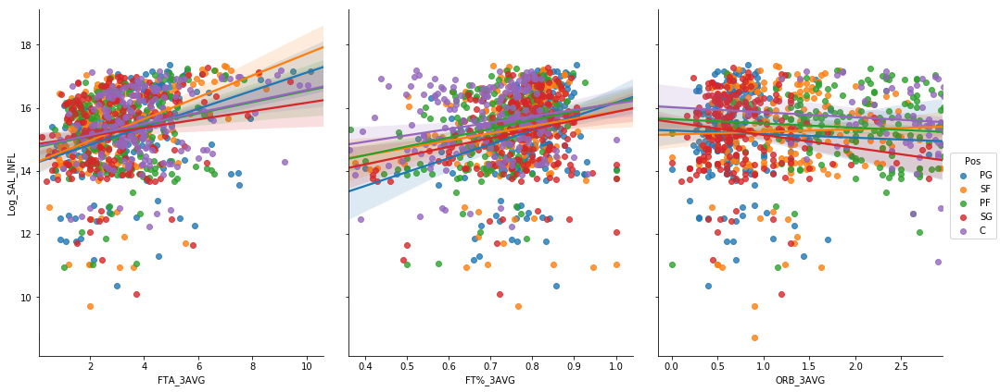

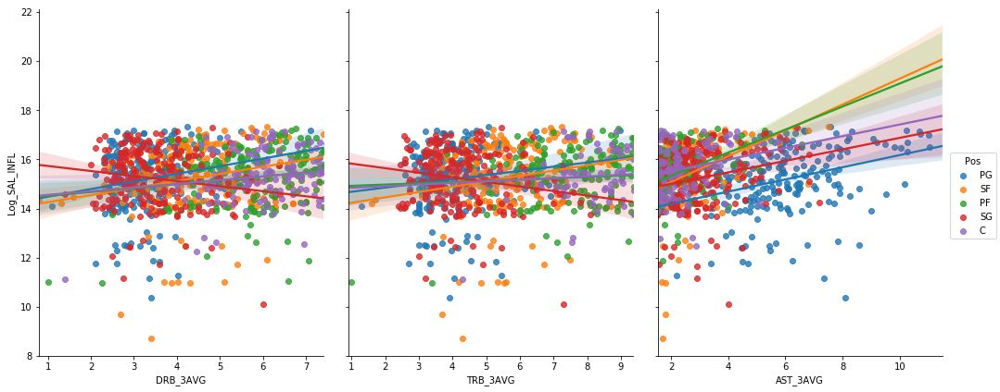

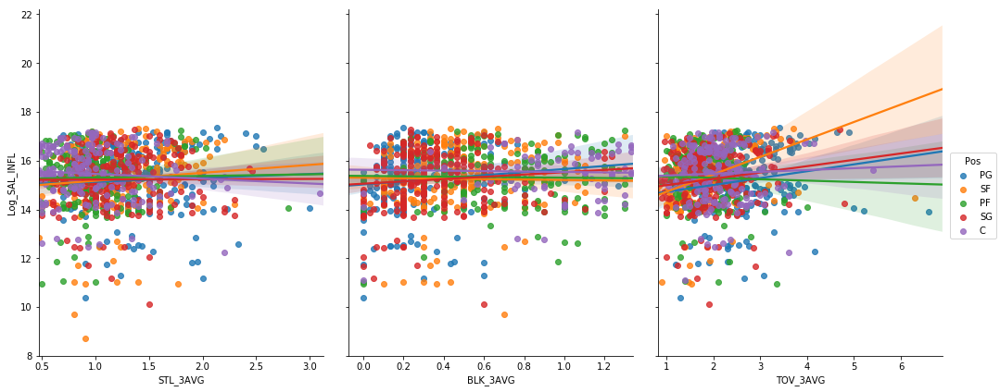

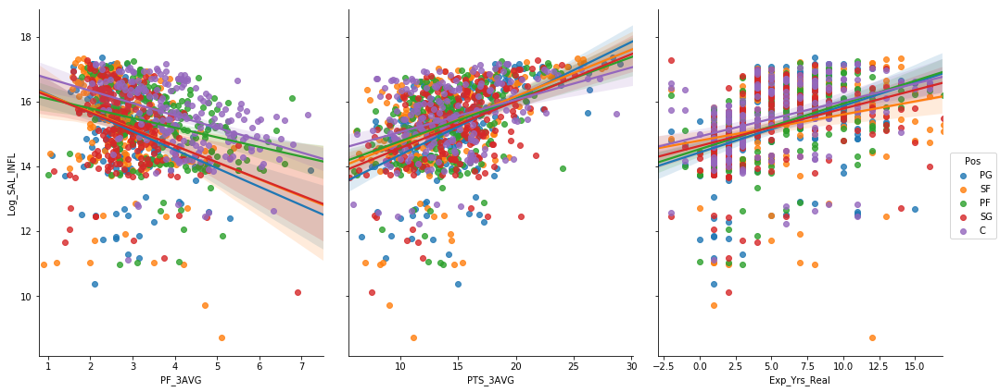

In [79]:
for i in range(13, 56, 3):
    sns.pairplot(DF_Modeling2, x_vars=DF_Modeling2.columns.tolist()[i:i+3], 
                     y_vars='Log_SAL_INFL',hue = 'Pos', size=6, aspect=0.8, kind='reg')

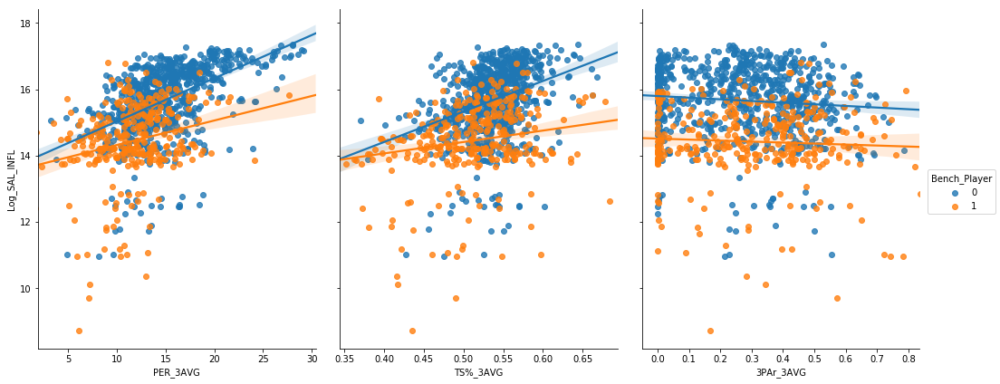

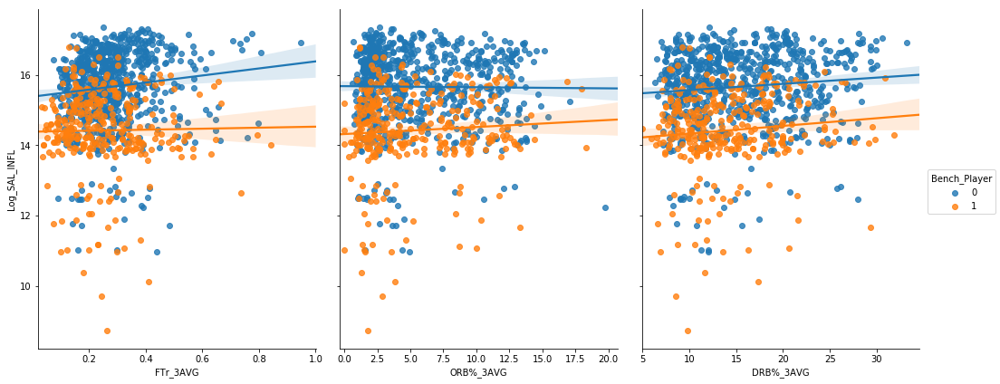

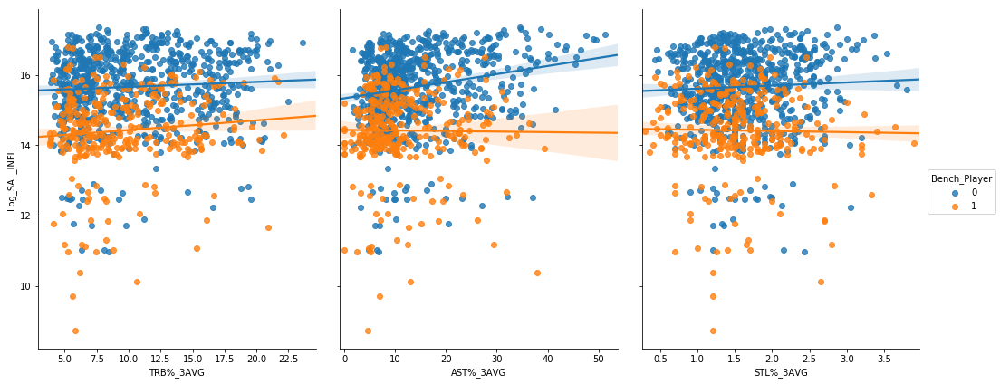

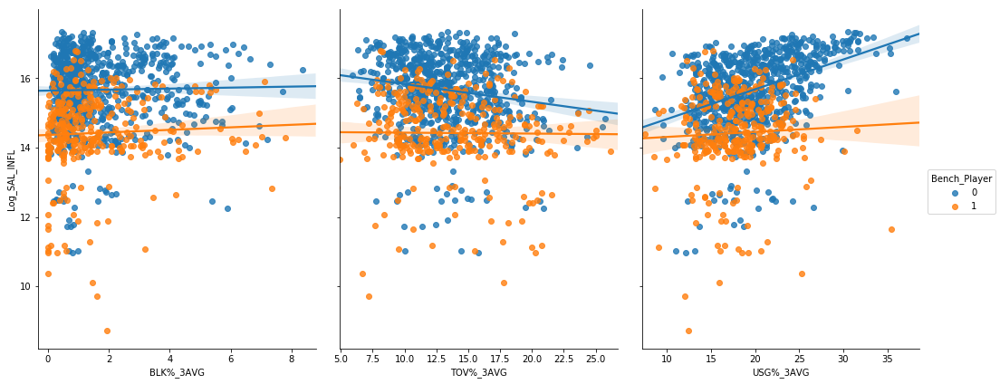

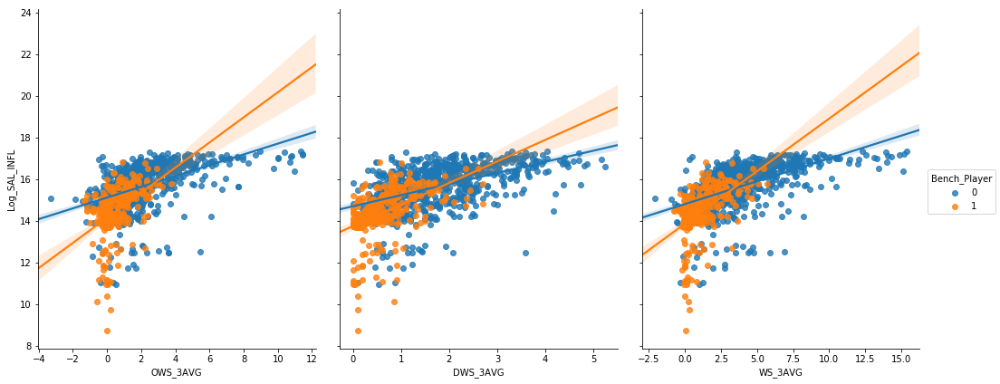

...

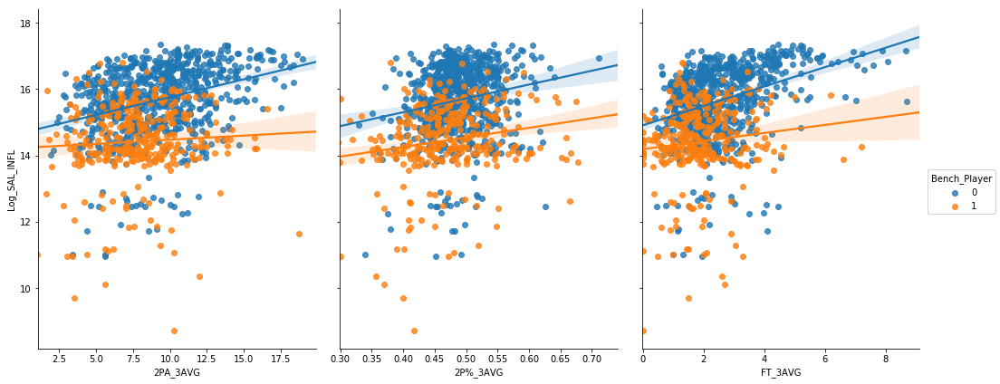

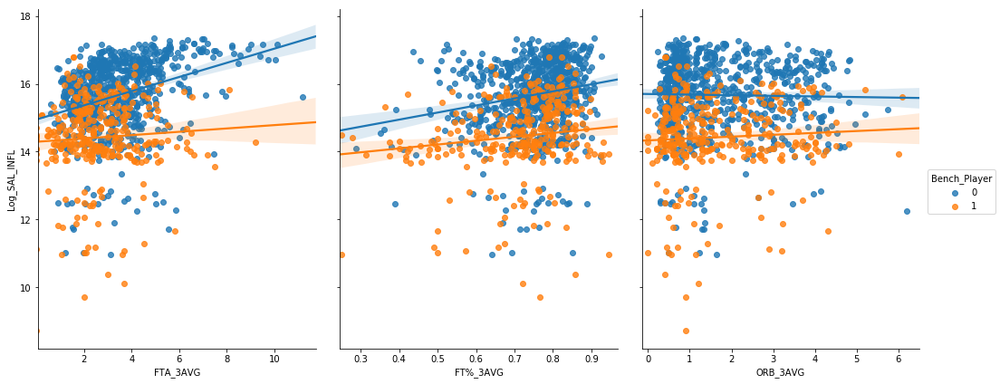

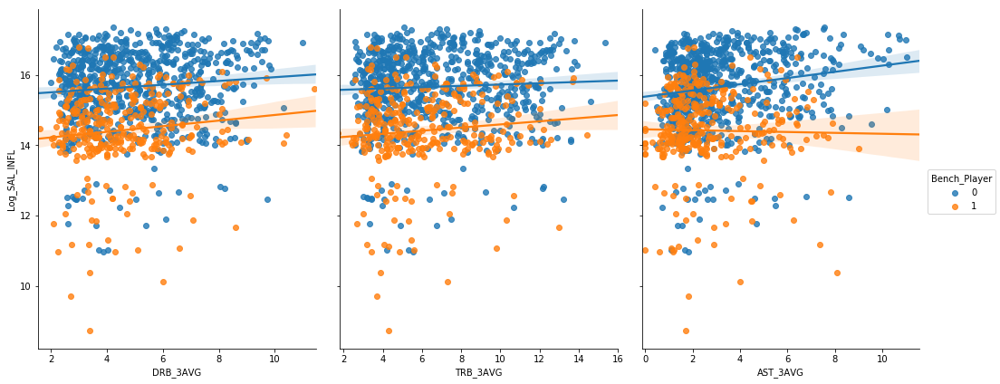

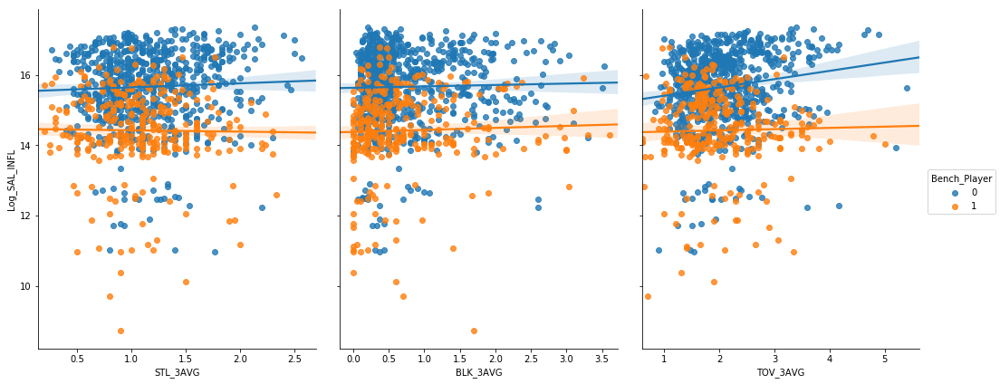

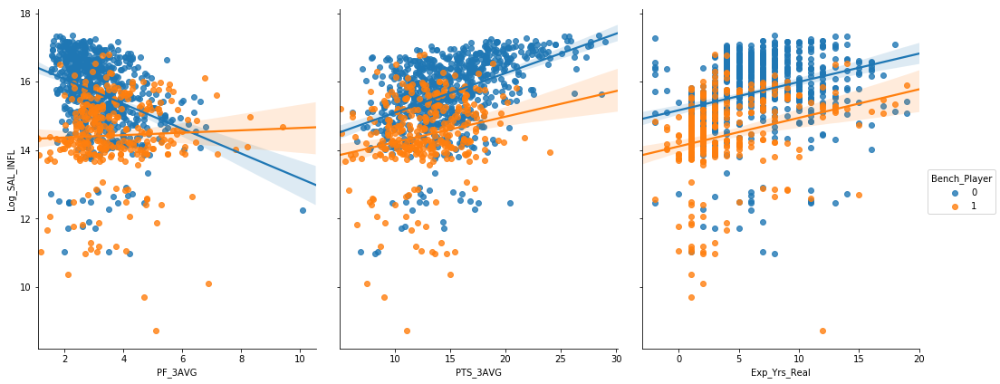

In [80]:
for i in range(13, 56, 3):
    sns.pairplot(DF_Modeling2, x_vars=DF_Modeling2.columns.tolist()[i:i+3], 
                     y_vars='Log_SAL_INFL',hue = 'Bench_Player', size=6, aspect=0.8, kind='reg')

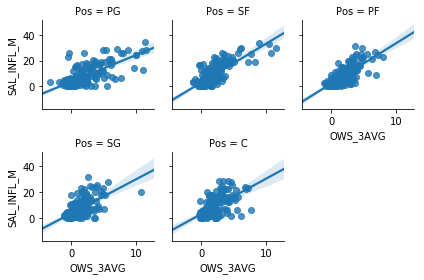

In [81]:
sns.lmplot(x="OWS_3AVG",
           y ="SAL_INFL_M",
           col = "Pos",
           data = DF_Modeling2,
           col_wrap = 3, size= 2);


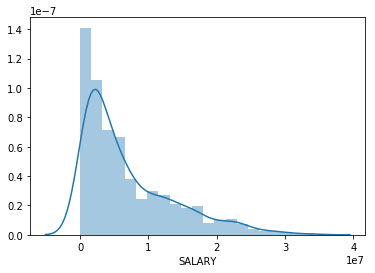

In [82]:
sns.distplot(DF_Modeling2.SALARY);


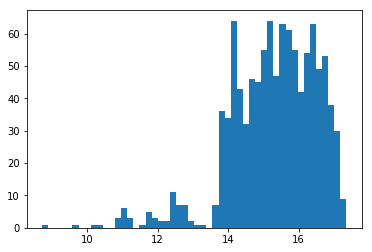

In [83]:
plt.hist(DF_Modeling2.Log_SAL_INFL,bins=50);

In [84]:
DF_Modeling2.columns

Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Player_Match', 'bling1',
       'bling2', 'name', 'weight', 'height_in', 'College_Ind', 'Award_Ind',
       'Pos', 'PER_3AVG', 'TS%_3AVG', '3PAr_3AVG', 'FTr_3AVG', 'ORB%_3AVG',
       'DRB%_3AVG', 'TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG', 'BLK%_3AVG',
       'TOV%_3AVG', 'USG%_3AVG', 'OWS_3AVG', 'DWS_3AVG', 'WS_3AVG',
       'WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG', 'BPM_3AVG', 'VORP_3AVG',
       'G_3AVG', 'GS_3AVG', 'MP_3AVG', 'FG_3AVG', 'FGA_3AVG', 'FG%_3AVG',
       '3P_3AVG', '3PA_3AVG', '3P%_3AVG', '2P_3AVG', '2PA_3AVG', '2P%_3AVG',
       'FT_3AVG', 'FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG', 'DRB_3AVG', 'TRB_3AVG',
       'AST_3AVG', 'STL_3AVG', 'BLK_3AVG', 'TOV_3AVG', 'PF_3AVG', 'PTS_3AVG',
       'Exp_Yrs_Real', 'Bench_Player', 'SALARY_M', 'SAL_INFL', 'SAL_INFL_M',
       'Log_SAL', 'Log_SAL_INFL', 'Center', 'PowerFwd', 'PointG', 'SmallFwd',
       'SAL_bins'],
      dtype='object')

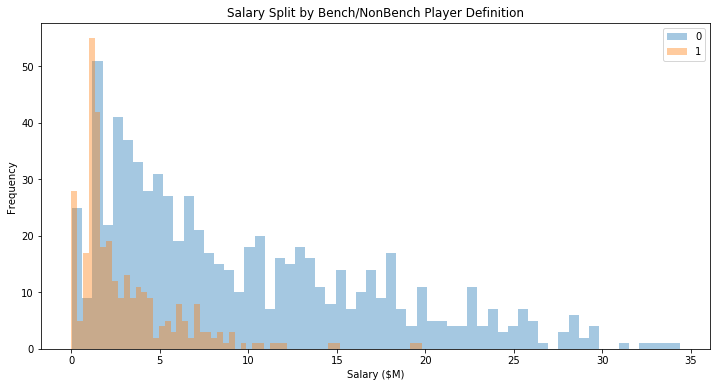

In [112]:
group_bench = DF_Modeling2.groupby('Bench_Player')['SAL_INFL_M'] # group values by carrier, select minutes delayed
group_bench.plot(kind='hist', figsize=[12,6], bins=60, alpha=.4, legend=True); # alpha for transparency
plt.title("Salary Split by Bench/NonBench Player Definition")
plt.xlabel("Salary ($M)");
#sns.distplot(DF_Modeling2.Log_SAL_INFL, );

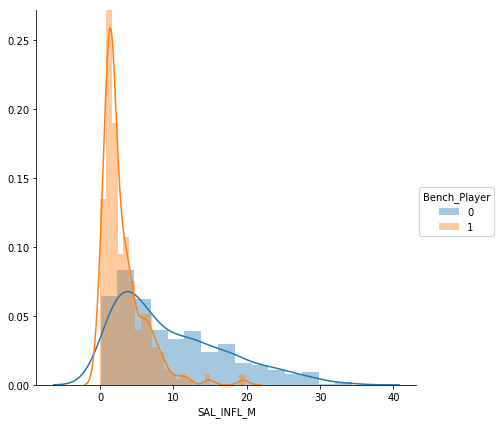

In [122]:
g = sns.FacetGrid(DF_Modeling2, hue='Bench_Player', size=6)
g.map(sns.distplot, "SAL_INFL_M")
g.add_legend();

In [114]:
DF_Modeling2.head()

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,...,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd,SAL_bins
0,"Stephen Curry, PG",Golden State Warriors,34382550.0,2018,STEPHEN CURRY,4x All Star,2015-16 NBA Scoring Champ,Stephen Curry,190.0,75.0,...,34.382550,34382550.0,34.382550,17.353060,17.353060,0,0,1,0,"(28.653, 34.383]"
1,"LeBron James, SF",Cleveland Cavaliers,33285709.0,2018,LEBRON JAMES,13x All Star,2007-08 NBA Scoring Champ,LeBron James,250.0,80.0,...,33.285709,33285709.0,33.285709,17.320639,17.320639,0,0,0,1,"(28.653, 34.383]"
2,"Paul Millsap, PF",Denver Nuggets,31269231.0,2018,PAUL MILLSAP,4x All Star,2015-16 All-Defensive,Paul Millsap,246.0,80.0,...,31.269231,31269231.0,31.269231,17.258145,17.258145,0,1,0,0,"(28.653, 34.383]"
3,"Gordon Hayward, SF",Boston Celtics,29727900.0,2018,GORDON HAYWARD,1x All Star,None,Gordon Hayward,226.0,80.0,...,29.727900,29727900.0,29.727900,17.207597,17.207597,0,0,0,1,"(28.653, 34.383]"
4,"Blake Griffin, PF",LA Clippers,29512900.0,2018,BLAKE GRIFFIN,5x All Star,4x All-NBA,Blake Griffin,251.0,82.0,...,29.512900,29512900.0,29.512900,17.200338,17.200338,0,1,0,0,"(28.653, 34.383]"


In [120]:
DF_Modeling2.columns

Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Player_Match', 'bling1',
       'bling2', 'name', 'weight', 'height_in', 'College_Ind', 'Award_Ind',
       'Pos', 'PER_3AVG', 'TS%_3AVG', '3PAr_3AVG', 'FTr_3AVG', 'ORB%_3AVG',
       'DRB%_3AVG', 'TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG', 'BLK%_3AVG',
       'TOV%_3AVG', 'USG%_3AVG', 'OWS_3AVG', 'DWS_3AVG', 'WS_3AVG',
       'WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG', 'BPM_3AVG', 'VORP_3AVG',
       'G_3AVG', 'GS_3AVG', 'MP_3AVG', 'FG_3AVG', 'FGA_3AVG', 'FG%_3AVG',
       '3P_3AVG', '3PA_3AVG', '3P%_3AVG', '2P_3AVG', '2PA_3AVG', '2P%_3AVG',
       'FT_3AVG', 'FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG', 'DRB_3AVG', 'TRB_3AVG',
       'AST_3AVG', 'STL_3AVG', 'BLK_3AVG', 'TOV_3AVG', 'PF_3AVG', 'PTS_3AVG',
       'Exp_Yrs_Real', 'Bench_Player', 'SALARY_M', 'SAL_INFL', 'SAL_INFL_M',
       'Log_SAL', 'Log_SAL_INFL', 'Center', 'PowerFwd', 'PointG', 'SmallFwd',
       'SAL_bins'],
      dtype='object')

In [121]:
DF_Modeling2[DF_Modeling2['NAME'] == 'Stephen Curry, PG'][['NAME','TEAM','Contract_Yr','SALARY_M','PER_3AVG', 'MP_3AVG']]

,NAME,TEAM,Contract_Yr,SALARY_M,PER_3AVG,MP_3AVG
0,"Stephen Curry, PG",Golden State Warriors,2018,34.382550,28.033333,2650.333333
525,"Stephen Curry, PG",Golden State Warriors,2017,12.112359,26.925000,2797.333333
957,"Stephen Curry, PG",Golden State Warriors,2016,11.370786,24.466667,2814.000000


In [94]:
DF_Modeling2.Bench_Player.value_counts()

0    729
1    319
Name: Bench_Player, dtype: int64

In [95]:
x = DF_Modeling2[DF_Modeling2['Log_SAL_INFL'] < 2.6]

In [96]:
x.describe()

,SALARY,Contract_Yr,weight,height_in,College_Ind,Award_Ind,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,...,PTS_3AVG,Exp_Yrs_Real,Bench_Player,SAL_INFL,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


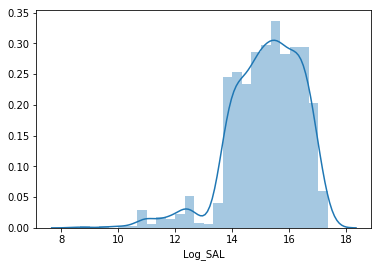

In [98]:
sns.distplot(DF_Modeling2.Log_SAL);

''

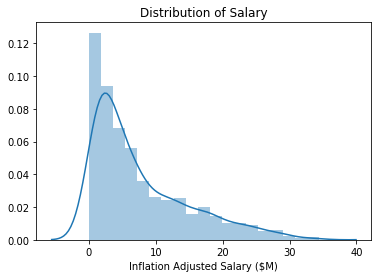

In [103]:
sns.distplot(DF_Modeling2.SAL_INFL_M)
plt.title("Distribution of Salary")
plt.xlabel("Inflation Adjusted Salary ($M)")
;

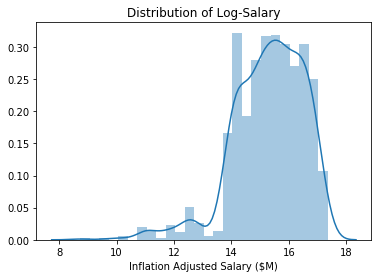

In [104]:
sns.distplot(DF_Modeling2.Log_SAL_INFL)
plt.title("Distribution of Log-Salary")
plt.xlabel("Inflation Adjusted Salary ($M)");

In [102]:
DF_Modeling2.columns

Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Player_Match', 'bling1',
       'bling2', 'name', 'weight', 'height_in', 'College_Ind', 'Award_Ind',
       'Pos', 'PER_3AVG', 'TS%_3AVG', '3PAr_3AVG', 'FTr_3AVG', 'ORB%_3AVG',
       'DRB%_3AVG', 'TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG', 'BLK%_3AVG',
       'TOV%_3AVG', 'USG%_3AVG', 'OWS_3AVG', 'DWS_3AVG', 'WS_3AVG',
       'WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG', 'BPM_3AVG', 'VORP_3AVG',
       'G_3AVG', 'GS_3AVG', 'MP_3AVG', 'FG_3AVG', 'FGA_3AVG', 'FG%_3AVG',
       '3P_3AVG', '3PA_3AVG', '3P%_3AVG', '2P_3AVG', '2PA_3AVG', '2P%_3AVG',
       'FT_3AVG', 'FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG', 'DRB_3AVG', 'TRB_3AVG',
       'AST_3AVG', 'STL_3AVG', 'BLK_3AVG', 'TOV_3AVG', 'PF_3AVG', 'PTS_3AVG',
       'Exp_Yrs_Real', 'Bench_Player', 'SAL_INFL', 'Log_SAL', 'Log_SAL_INFL',
       'Center', 'PowerFwd', 'PointG', 'SmallFwd', 'SAL_bins'],
      dtype='object')

In [103]:
x = DF_Modeling2[DF_Modeling2['Log_SAL'] < 13][['NAME', 'SALARY', 'MP_3AVG', 'GS_3AVG', 'Exp_Yrs_Real','Log_SAL']]
x

,NAME,SALARY,MP_3AVG,GS_3AVG,Exp_Yrs_Real,Log_SAL
443,"Toney Douglas, PG",379159.0,611.000000,6.000000,8.0,12.845711
444,"Lamar Patterson, SG",246956.0,217.500000,0.000000,2.0,12.416965
445,"Larry Sanders, PF",207722.0,299.500000,13.000000,6.0,12.243956
447,"Manny Harris, PG",115344.0,25.000000,0.000000,4.0,11.655674
448,"Mike Tobey, C",67135.0,25.000000,0.000000,1.0,11.114461
449,"Justin Harper, PF",57672.0,33.000000,0.000000,3.0,10.962527
450,"Alonzo Gee, SF",57672.0,794.333333,13.333333,8.0,10.962527
451,"Jarell Eddie, SG",57672.0,104.500000,0.000000,2.0,10.962527
452,"Pierre Jackson, PG",31969.0,84.000000,1.000000,1.0,10.372522
862,"Toney Douglas, PG",379159.0,870.666667,17.333333,7.0,12.845711


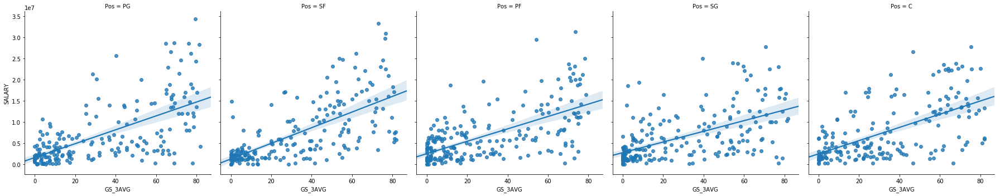

In [104]:
sns.lmplot(x="GS_3AVG",
           y ="SALARY",
           col = "Pos",
           data = DF_Modeling2);


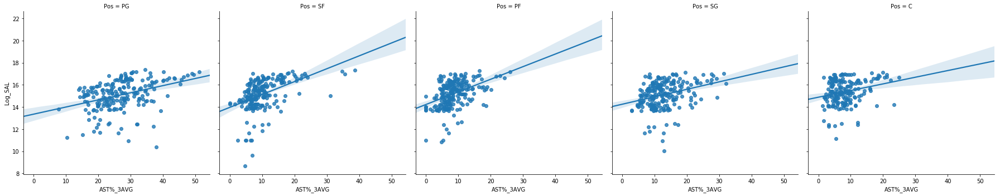

In [105]:
sns.lmplot(x="AST%_3AVG",
           y ="Log_SAL",
           col = "Pos",
           data = DF_Modeling2);


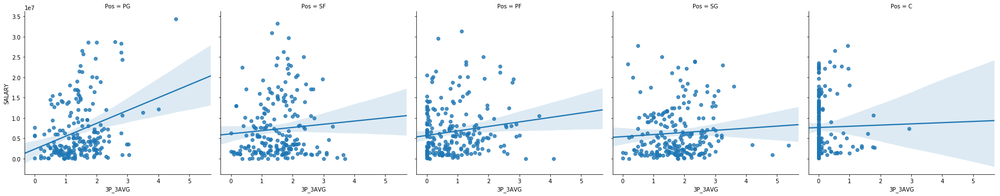

In [106]:


sns.lmplot(x="3P_3AVG",
           y ="SALARY",
           col = "Pos",
           data = DF_Modeling2);


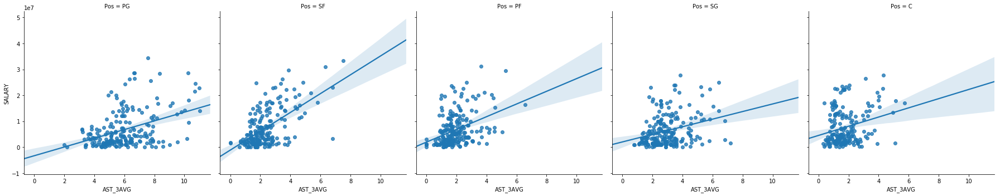

In [107]:
sns.lmplot(x="AST_3AVG",
           y ="SALARY",
           col = "Pos",
           data = DF_Modeling2);

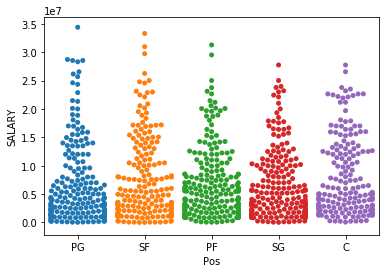

In [108]:
sns.swarmplot(data=DF_Modeling2, x="Pos", y="SALARY");

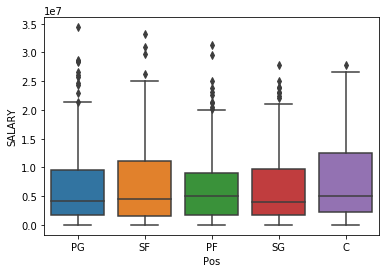

In [109]:
sns.boxplot(data=DF_Modeling2, x="Pos", y="SALARY");

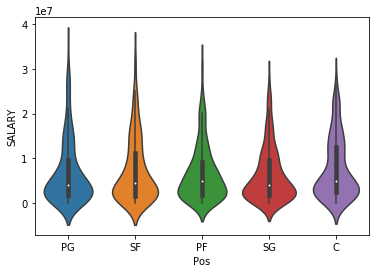

In [110]:
sns.violinplot(data=DF_Modeling2, x="Pos", y="SALARY");

In [111]:
DF_Modeling2.columns

Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Player_Match', 'bling1',
       'bling2', 'name', 'weight', 'height_in', 'College_Ind', 'Award_Ind',
       'Pos', 'PER_3AVG', 'TS%_3AVG', '3PAr_3AVG', 'FTr_3AVG', 'ORB%_3AVG',
       'DRB%_3AVG', 'TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG', 'BLK%_3AVG',
       'TOV%_3AVG', 'USG%_3AVG', 'OWS_3AVG', 'DWS_3AVG', 'WS_3AVG',
       'WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG', 'BPM_3AVG', 'VORP_3AVG',
       'G_3AVG', 'GS_3AVG', 'MP_3AVG', 'FG_3AVG', 'FGA_3AVG', 'FG%_3AVG',
       '3P_3AVG', '3PA_3AVG', '3P%_3AVG', '2P_3AVG', '2PA_3AVG', '2P%_3AVG',
       'FT_3AVG', 'FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG', 'DRB_3AVG', 'TRB_3AVG',
       'AST_3AVG', 'STL_3AVG', 'BLK_3AVG', 'TOV_3AVG', 'PF_3AVG', 'PTS_3AVG',
       'Exp_Yrs_Real', 'Bench_Player', 'SAL_INFL', 'Log_SAL', 'Log_SAL_INFL',
       'Center', 'PowerFwd', 'PointG', 'SmallFwd', 'SAL_bins'],
      dtype='object')

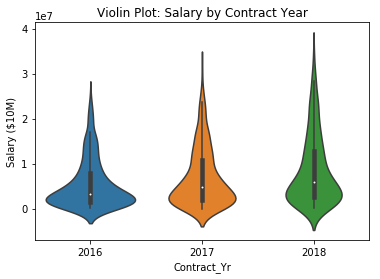

In [87]:
#sns.distplot(DF_Modeling2['SALARY'], hue='Contract_Yr')
sns.violinplot(data=DF_Modeling2, x="Contract_Yr", y="SALARY")
plt.ylabel("Salary ($10M)")
plt.title("Violin Plot: Salary by Contract Year");

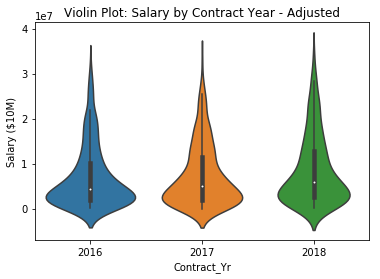

In [88]:
sns.violinplot(data=DF_Modeling2, x="Contract_Yr", y="SAL_INFL")
plt.ylabel("Salary ($10M)")
plt.title("Violin Plot: Salary by Contract Year - Adjusted");

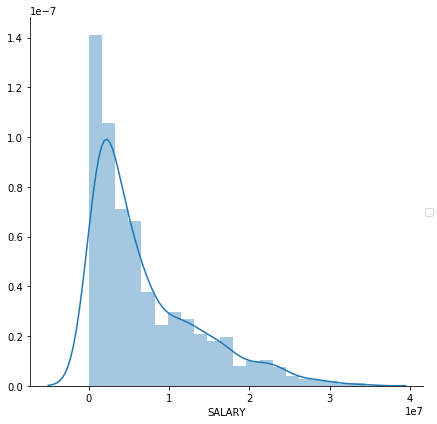

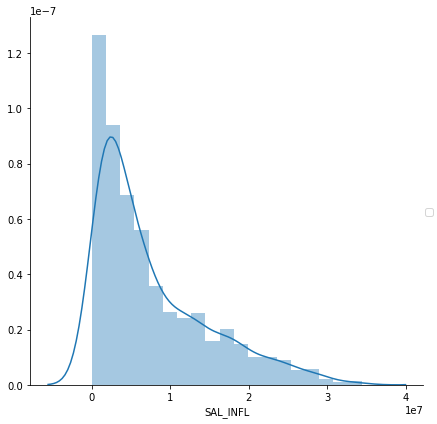

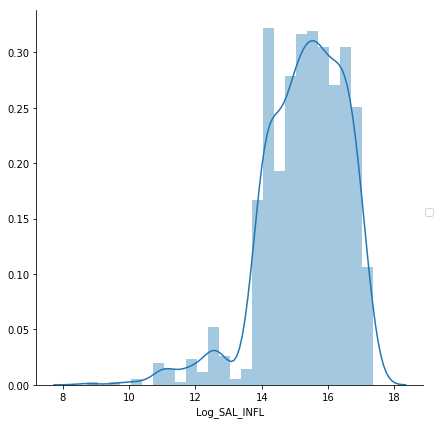

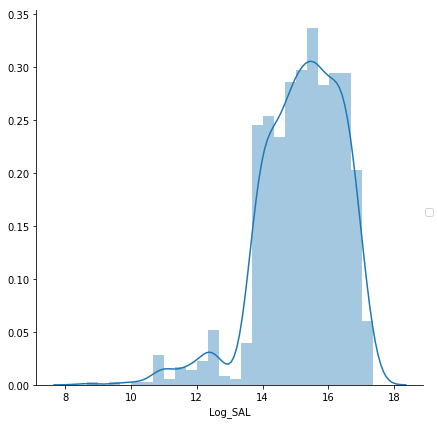

In [96]:
SALARIES = ['SALARY', 'SAL_INFL', 'Log_SAL_INFL', 'Log_SAL']
for SAL in SALARIES:
    g = sns.FacetGrid(DF_Modeling2, size=6)
    g.map(sns.distplot, SAL)
    g.add_legend();

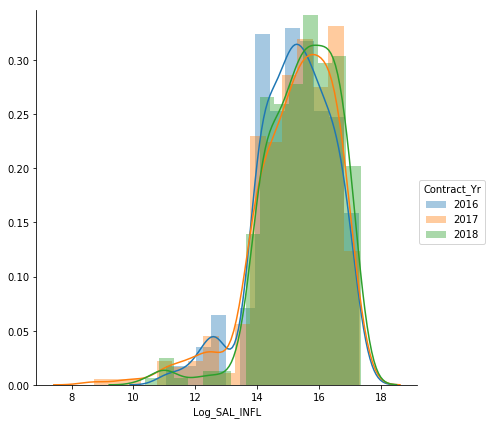

In [93]:
g = sns.FacetGrid(DF_Modeling2, hue='Contract_Yr', size=6)
g.map(sns.distplot, "Log_SAL_INFL")
g.add_legend();

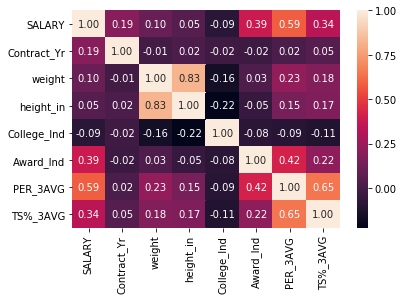

In [114]:

sns.heatmap(DF_Modeling2[DF_Modeling2.columns.tolist()[2:15]].corr(), annot=True, fmt=".2f");

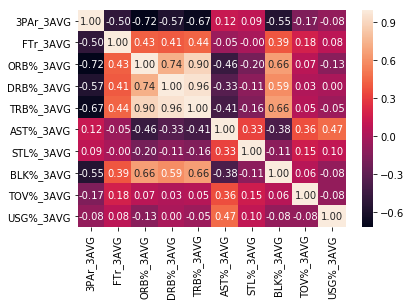

In [115]:
sns.heatmap(DF_Modeling2[DF_Modeling2.columns.tolist()[15:25]].corr(), annot=True, fmt=".2f");

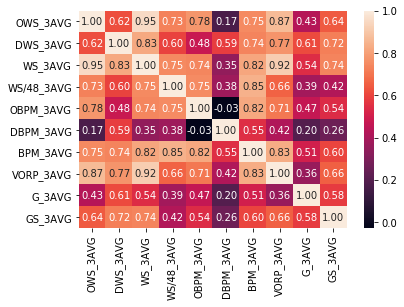

In [116]:
sns.heatmap(DF_Modeling2[DF_Modeling2.columns.tolist()[25:35]].corr(), annot=True, fmt=".2f");

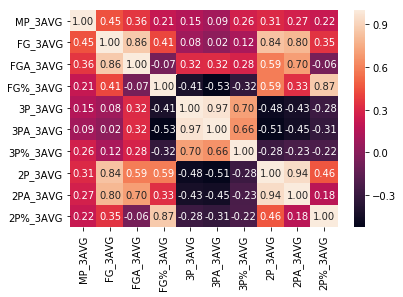

In [117]:
sns.heatmap(DF_Modeling2[DF_Modeling2.columns.tolist()[35:45]].corr(), annot=True, fmt=".2f");

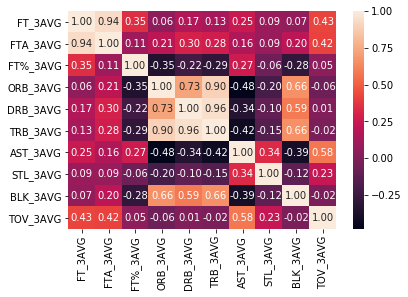

In [118]:
sns.heatmap(DF_Modeling2[DF_Modeling2.columns.tolist()[45:55]].corr(), annot=True, fmt=".2f");

In [119]:
DF_Modeling2[2:5]

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,...,Exp_Yrs_Real,Bench_Player,SAL_INFL,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd,SAL_bins
2,"Paul Millsap, PF",Denver Nuggets,31269231.0,2018,PAUL MILLSAP,4x All Star,2015-16 All-Defensive,Paul Millsap,246.0,80.0,...,11.0,0,31269231.0,17.258145,17.258145,0,1,0,0,"(28653086.167, 34382550.0]"
3,"Gordon Hayward, SF",Boston Celtics,29727900.0,2018,GORDON HAYWARD,1x All Star,None,Gordon Hayward,226.0,80.0,...,7.0,0,29727900.0,17.207597,17.207597,0,0,0,1,"(28653086.167, 34382550.0]"
4,"Blake Griffin, PF",LA Clippers,29512900.0,2018,BLAKE GRIFFIN,5x All Star,4x All-NBA,Blake Griffin,251.0,82.0,...,7.0,0,29512900.0,17.200338,17.200338,0,1,0,0,"(28653086.167, 34382550.0]"


In [120]:
# create X and y except now with more columns in X
mult_feature_cols = ['GS_3AVG', 'OWS_3AVG', 'Exp_Yrs_Real', '2P_3AVG']
X_mult = DF_Modeling2[mult_feature_cols]
y_mult = DF_Modeling2.Log_SAL

# instantiate and fit like last time
multiple_linreg = LinearRegression()
multiple_linreg.fit(X_mult, y_mult)

coeffs = multiple_linreg.coef_
intercept =  multiple_linreg.intercept_
# print the coefficients like last time
print(intercept)
print(coeffs)

13.8467384696
[ 0.01570421  0.14614751  0.04780107  0.08460944]


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/scipy/linalg/basic.py:1018: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  warnings.warn(mesg, RuntimeWarning)


In [95]:
# Necessary imports
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
sns.set_style("darkgrid")
%pylab inline

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


Populating the interactive namespace from numpy and matplotlib


In [50]:
# Create your feature matrix (X) and target vector (y)
y, X = patsy.dmatrices('Log_SAL ~ GS_3AVG + OWS_3AVG + Exp_Yrs_Real', data=DF_Modeling2, return_type="dataframe")
#mult_feature_cols = ['GS_3AVG', 'OWS_3AVG', 'Exp_Yrs_Real', '2P_3AVG']
#X = DF_Modeling2[mult_feature_cols]
#y = DF_Modeling2.Log_SAL

model = sm.OLS(y, X)
# Fit your model to your training set
fit = model.fit()
# Print summary statistics of the model's performance
fit.summary()

NameError: name 'patsy' is not defined

In [51]:
DF_Modeling2.columns

Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Player_Match', 'bling1',
       'bling2', 'name', 'weight', 'height_in', 'College_Ind', 'Award_Ind',
       'Pos', 'PER_3AVG', 'TS%_3AVG', '3PAr_3AVG', 'FTr_3AVG', 'ORB%_3AVG',
       'DRB%_3AVG', 'TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG', 'BLK%_3AVG',
       'TOV%_3AVG', 'USG%_3AVG', 'OWS_3AVG', 'DWS_3AVG', 'WS_3AVG',
       'WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG', 'BPM_3AVG', 'VORP_3AVG',
       'G_3AVG', 'GS_3AVG', 'MP_3AVG', 'FG_3AVG', 'FGA_3AVG', 'FG%_3AVG',
       '3P_3AVG', '3PA_3AVG', '3P%_3AVG', '2P_3AVG', '2PA_3AVG', '2P%_3AVG',
       'FT_3AVG', 'FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG', 'DRB_3AVG', 'TRB_3AVG',
       'AST_3AVG', 'STL_3AVG', 'BLK_3AVG', 'TOV_3AVG', 'PF_3AVG', 'PTS_3AVG',
       'Exp_Yrs_Real', 'Bench_Player', 'SALARY_M', 'SAL_INFL', 'SAL_INFL_M',
       'Log_SAL', 'Log_SAL_INFL', 'Center', 'PowerFwd', 'PointG', 'SmallFwd',
       'SAL_bins'],
      dtype='object')

In [52]:
# Create an empty model
lr = LinearRegression()

df_PG = DF_Modeling2[DF_Modeling2.Pos == 'SG']
# Choose the predictor variables, here all but the first which is the response variable
# This model is analogous to the Y ~ X1 + X2 + X3 + X4 + X5 + X6 model
# mult_feature_cols = ['GS_3AVG', 'OWS_3AVG', 'Exp_Yrs_Real', '2P_3AVG', '3P_3AVG', 'STL%_3AVG', 'AST%_3AVG']
mult_feature_cols = ['GS_3AVG', 'OWS_3AVG']
X = df_PG[mult_feature_cols]
y = df_PG['SALARY']

# Fit the model to the full dataset
lr.fit(X, y)
# Print out the R^2 for the model against the full dataset
lr.score(X, y)

0.41812182278743704

In [49]:
y_mult_pred = multiple_linreg.predict(X_mult)
metrics.r2_score(y_mult, y_mult_pred)

NameError: name 'multiple_linreg' is not defined

In [244]:
X_train, X_test, y_train, y_test = train_test_split(X_mult, y_mult)

model= LinearRegression()
model.fit(X_train,y_train)
print(f"train r2: {model.score(X_train,y_train):.2%}, "
      f"test r2: {model.score(X_test,y_test):.2%}")

train r2: 53.87%, test r2: 55.11%


In [46]:
from sklearn.cross_validation import cross_val_score

In [47]:
# 10-fold cross-validation with our fake data
reg = LinearRegression()
scores = cross_val_score(reg, X_mult, y_mult, cv=10, scoring='r2_score')

# scores output is negative, a sklearn quirk bc mse is used to min. optimization func.
print(-scores)

NameError: name 'X_mult' is not defined

#### Lasso Regression

In [365]:
from sklearn.model_selection import cross_val_score, train_test_split


In [369]:
DF_Modeling2.columns

Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Player_Match', 'bling1',
       'bling2', 'name', 'weight', 'height_in', 'College_Ind', 'Award_Ind',
       'Pos', 'PER_3AVG', 'TS%_3AVG', '3PAr_3AVG', 'FTr_3AVG', 'ORB%_3AVG',
       'DRB%_3AVG', 'TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG', 'BLK%_3AVG',
       'TOV%_3AVG', 'USG%_3AVG', 'OWS_3AVG', 'DWS_3AVG', 'WS_3AVG',
       'WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG', 'BPM_3AVG', 'VORP_3AVG',
       'G_3AVG', 'GS_3AVG', 'MP_3AVG', 'FG_3AVG', 'FGA_3AVG', 'FG%_3AVG',
       '3P_3AVG', '3PA_3AVG', '3P%_3AVG', '2P_3AVG', '2PA_3AVG', '2P%_3AVG',
       'FT_3AVG', 'FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG', 'DRB_3AVG', 'TRB_3AVG',
       'AST_3AVG', 'STL_3AVG', 'BLK_3AVG', 'TOV_3AVG', 'PF_3AVG', 'PTS_3AVG',
       'Exp_Yrs_Real', 'Bench_Player', 'SAL_INFL', 'Log_SAL', 'Log_SAL_INFL',
       'Center', 'PowerFwd', 'PointG', 'SmallFwd'],
      dtype='object')

In [56]:
X_all_cols = DF_Modeling2.columns.tolist()[8:12] + \
             DF_Modeling2.columns.tolist()[25:35]+\
             DF_Modeling2.columns.tolist()[-4:]
#              DF_Modeling2.columns.tolist()[14:-7] + \
        
X_mult_all = DF_Modeling2[X_all_cols]
X_mult_all.head()

,weight,height_in,College_Ind,Award_Ind,OWS_3AVG,DWS_3AVG,WS_3AVG,WS/48_3AVG,OBPM_3AVG,DBPM_3AVG,BPM_3AVG,VORP_3AVG,G_3AVG,GS_3AVG,PowerFwd,PointG,SmallFwd,SAL_bins
0,190.0,75.0,1.0,1.0,11.333333,4.033333,15.400000,0.278333,9.933333,0.000000,9.900000,7.966667,79.333333,79.333333,0,1,0,"(28653086.167, 34382550.0]"
1,250.0,80.0,0.0,1.0,8.933333,3.300000,12.300000,0.220667,6.633333,1.700000,8.300000,6.933333,73.000000,73.000000,0,0,1,"(28653086.167, 34382550.0]"
2,246.0,80.0,1.0,1.0,3.566667,4.700000,8.266667,0.160333,1.066667,2.966667,4.066667,3.766667,74.333333,73.666667,1,0,0,"(28653086.167, 34382550.0]"
3,226.0,80.0,1.0,1.0,6.133333,3.200000,9.333333,0.168333,3.366667,0.000000,3.366667,3.633333,76.333333,76.333333,0,0,1,"(28653086.167, 34382550.0]"
4,251.0,82.0,1.0,1.0,4.733333,2.133333,6.833333,0.172667,2.666667,1.300000,3.933333,2.866667,54.333333,54.333333,1,0,0,"(28653086.167, 34382550.0]"


In [407]:
#generate the polynomial transformer
pf_2 = PolynomialFeatures(degree=2, interaction_only=True)

#apply it to the data, but ignore the first constant column
pf_2_data = pf_2.fit_transform(X_mult_all)


array([[   1.,  190.,   75., ...,    0.,    0.,    0.],
       [   1.,  250.,   80., ...,    0.,    0.,    0.],
       [   1.,  246.,   80., ...,    0.,    0.,    0.],
       ..., 
       [   1.,  190.,   77., ...,    0.,    0.,    0.],
       [   1.,  175.,   71., ...,    0.,    0.,    0.],
       [   1.,  218.,   81., ...,    0.,    0.,    0.]])

In [402]:
lasso = Lasso(max_iter=10000) #increase the number of iterations for lasso to prevent lack of convergence

mse_poly2_lasso = np.abs(cross_val_score(lasso, pf_2_data, y_mult, cv=10))
#rmses_lasso_poly3 = map(np.sqrt, mse_poly3_lasso)
rmses_lasso_poly2 = np.sqrt(mse_poly3_lasso)
print("10-fold mean RMSE for degree-3 case, strongest lasso regularization: ", np.mean(rmses_lasso_poly2))

10-fold mean RMSE for degree-3 case, strongest lasso regularization:  1.77075951266


In [403]:
mse_poly3_lasso

array([ 9.52761571,  8.99842531,  1.05776458,  0.49861077,  8.75894253,
        1.68016891,  0.26030968,  2.3140061 ,  3.9476289 ,  2.60032925])

In [404]:
np.sqrt(mse_poly3_lasso)

array([ 3.08668361,  2.99973754,  1.02847683,  0.70612377,  2.95955107,
        1.2962133 ,  0.51020553,  1.52118576,  1.98686409,  1.61255364])

In [405]:

lasso_all = Lasso().fit(pf_2_data, y_mult)
print( "Number of features in the model: ", len(lasso_all.coef_))
non_zero_features_mask = np.abs(lasso_all.coef_) > 0.0001  # create a mask of Booleans if the Coeff > 0.0001

print( non_zero_features_mask)
print( "Number of non-zero features in the model: ", np.sum(non_zero_features_mask.astype(int)))
print( "Fraction of total features used: ", float(np.sum(non_zero_features_mask.astype(int))) / len(lasso_all.coef_))

Number of features in the model:  172
[False False False False False False False False False False False False
 False False False False False False False False False False False  True
  True False False False  True False False  True False False  True  True
 False False False False False False False False  True False  True  True
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False  True False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False  True False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False  True 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


In [ ]:
coeff_df = pd.DataFrame(zip(housing_features, np.abs(lasso_all.coef_)), columns=["features","betas"])


In [227]:
DF_Modeling2.columns


Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Player_Match', 'bling1',
       'bling2', 'name', 'weight', 'height_in', 'College_Ind', 'Award_Ind',
       'Pos', 'PER_3AVG', 'TS%_3AVG', '3PAr_3AVG', 'FTr_3AVG', 'ORB%_3AVG',
       'DRB%_3AVG', 'TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG', 'BLK%_3AVG',
       'TOV%_3AVG', 'USG%_3AVG', 'OWS_3AVG', 'DWS_3AVG', 'WS_3AVG',
       'WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG', 'BPM_3AVG', 'VORP_3AVG',
       'G_3AVG', 'GS_3AVG', 'MP_3AVG', 'FG_3AVG', 'FGA_3AVG', 'FG%_3AVG',
       '3P_3AVG', '3PA_3AVG', '3P%_3AVG', '2P_3AVG', '2PA_3AVG', '2P%_3AVG',
       'FT_3AVG', 'FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG', 'DRB_3AVG', 'TRB_3AVG',
       'AST_3AVG', 'STL_3AVG', 'BLK_3AVG', 'TOV_3AVG', 'PF_3AVG', 'PTS_3AVG',
       'Exp_Yrs_Real', 'Log_SAL'],
      dtype='object')

In [337]:
DF_Modeling2.columns.tolist()[8:12] + DF_Modeling2.columns.tolist()[13:]

['weight',
 'height_in',
 'College_Ind',
 'Award_Ind',
 'PER_3AVG',
 'TS%_3AVG',
 '3PAr_3AVG',
 'FTr_3AVG',
 'ORB%_3AVG',
 'DRB%_3AVG',
 'TRB%_3AVG',
 'AST%_3AVG',
 'STL%_3AVG',
 'BLK%_3AVG',
 'TOV%_3AVG',
 'USG%_3AVG',
 'OWS_3AVG',
 'DWS_3AVG',
 'WS_3AVG',
 'WS/48_3AVG',
 'OBPM_3AVG',
 'DBPM_3AVG',
 'BPM_3AVG',
 'VORP_3AVG',
 'G_3AVG',
 'GS_3AVG',
 'MP_3AVG',
 'FG_3AVG',
 'FGA_3AVG',
 'FG%_3AVG',
 '3P_3AVG',
 '3PA_3AVG',
 '3P%_3AVG',
 '2P_3AVG',
 '2PA_3AVG',
 '2P%_3AVG',
 'FT_3AVG',
 'FTA_3AVG',
 'FT%_3AVG',
 'ORB_3AVG',
 'DRB_3AVG',
 'TRB_3AVG',
 'AST_3AVG',
 'STL_3AVG',
 'BLK_3AVG',
 'TOV_3AVG',
 'PF_3AVG',
 'PTS_3AVG',
 'Exp_Yrs_Real',
 'Bench_Player',
 'SAL_INFL',
 'Log_SAL',
 'Log_SAL_INFL',
 'C',
 'PG',
 'SF']

In [ ]:
y_mult_pred = multiple_linreg.predict(X_mult)
metrics.r2_score(y_mult, y_mult_pred)

In [71]:
DF_Modeling2[DF_Modeling2['3PAr_3AVG'] > 8]

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,College_Ind,Award_Ind,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,ORB%_3AVG,DRB%_3AVG,TRB%_3AVG,AST%_3AVG,STL%_3AVG,BLK%_3AVG,TOV%_3AVG,USG%_3AVG,OWS_3AVG,DWS_3AVG,WS_3AVG,WS/48_3AVG,OBPM_3AVG,DBPM_3AVG,BPM_3AVG,VORP_3AVG,G_3AVG,GS_3AVG,MP_3AVG,FG_3AVG,FGA_3AVG,FG%_3AVG,3P_3AVG,3PA_3AVG,3P%_3AVG,2P_3AVG,2PA_3AVG,2P%_3AVG,FT_3AVG,FTA_3AVG,FT%_3AVG,ORB_3AVG,DRB_3AVG,TRB_3AVG,AST_3AVG,STL_3AVG,BLK_3AVG,TOV_3AVG,PF_3AVG,PTS_3AVG,Exp_Yrs_Real


In [72]:
DF_Modeling2[DF_Modeling2['FTr_3AVG'] > 4]

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,College_Ind,Award_Ind,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,ORB%_3AVG,DRB%_3AVG,TRB%_3AVG,AST%_3AVG,STL%_3AVG,BLK%_3AVG,TOV%_3AVG,USG%_3AVG,OWS_3AVG,DWS_3AVG,WS_3AVG,WS/48_3AVG,OBPM_3AVG,DBPM_3AVG,BPM_3AVG,VORP_3AVG,G_3AVG,GS_3AVG,MP_3AVG,FG_3AVG,FGA_3AVG,FG%_3AVG,3P_3AVG,3PA_3AVG,3P%_3AVG,2P_3AVG,2PA_3AVG,2P%_3AVG,FT_3AVG,FTA_3AVG,FT%_3AVG,ORB_3AVG,DRB_3AVG,TRB_3AVG,AST_3AVG,STL_3AVG,BLK_3AVG,TOV_3AVG,PF_3AVG,PTS_3AVG,Exp_Yrs_Real


In [174]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cross_validation import KFold
from sklearn import datasets
sns.set_style("darkgrid")

%pylab inline

Populating the interactive namespace from numpy and matplotlib


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [186]:

def f(x):
    return np.sin(2 * np.pi * x)

def plot_approximation(est, ax, label=None):
    """Plot the approximation of ``est`` on axis ``ax``. """
#     ax.plot(x_plot, f(x_plot), label='ground truth', color='green')
    ax.scatter(X, y, s=100)
    ax.plot(x_plot, est.predict(x_plot[:, np.newaxis]), color='red', label=label)
    ax.set_ylim((-2, 2))
    ax.set_xlim((0, 1))
    ax.set_ylabel('y')
    ax.set_xlabel('x')
    ax.legend(loc='upper right',frameon=True)

x_plot = np.linspace(0, 1, 100)

In [229]:
mult_feature_cols = ['GS_3AVG', 'OWS_3AVG', 'Exp_Yrs_Real', '2P_3AVG']
X_mult = DF_Modeling2[mult_feature_cols]
y_mult = DF_Modeling2.Log_SAL

In [230]:
X_mult.shape

(1048, 4)

In [231]:
y_mult = y_mult.values.reshape(-1,1)

In [232]:

X_train, X_test, y_train, y_test = train_test_split(X_mult, y_mult, test_size=0.8)


In [233]:
from sklearn.linear_model import LassoCV

In [236]:
lcv = LassoCV(cv = 10)

In [237]:

lcv.fit(X_mult, y_mult)
lcv.score(X_test, y_test)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:1094: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.41630726761396303